# <b><u> Project Title : Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


## <b> Data Description </b>

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

#<b> Install & Import Modules

In [6]:
# importing numpy and pandas
import numpy as np 
import pandas as pd

# Importing Visualization Libraries
import matplotlib.pyplot as plt 
import seaborn as sns

# Importing warning for ignore warnings 
import warnings
warnings.filterwarnings("ignore")

# Import Gridsearch cv & Randomsearch cv for hyperparameter tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Importing Models
from sklearn.linear_model import LinearRegression,Lasso,Ridge,SGDRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import StackingRegressor

# import evalution metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

# import for model explainibility
import lime
from lime import lime_tabular
#import eli5 as eli
import shap

#importing all other required libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer
from sklearn.tree import export_graphviz

#to display all the graph in the workbook 
sns.set_style("whitegrid",{'grid.linestyle': '--'})


## <b> Loading the dataset

In [8]:
data= pd.read_csv("SeoulBikeData.csv", encoding = "ISO-8859-1")

In [9]:
# Copy the data for backup
df = data.copy()

In [10]:
# Getting feel of the data
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [11]:
df.tail()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [12]:
# Data shape
df.shape

(8760, 14)

In [13]:
# data dtype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [14]:
# Statistical info 
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,8760,365,01/12/2017,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rented Bike Count,8760.0,NaN,NaN,NaN,704.602055,644.997468,0.0,191.0,504.5,1065.25,3556.0
Hour,8760.0,NaN,NaN,NaN,11.5,6.922582,0.0,5.75,11.5,17.25,23.0
Temperature(°C),8760.0,NaN,NaN,NaN,12.882922,11.944825,-17.8,3.5,13.7,22.5,39.4
Humidity(%),8760.0,NaN,NaN,NaN,58.226256,20.362413,0.0,42.0,57.0,74.0,98.0
Wind speed (m/s),8760.0,NaN,NaN,NaN,1.724909,1.0363,0.0,0.9,1.5,2.3,7.4
Visibility (10m),8760.0,NaN,NaN,NaN,1436.825799,608.298712,27.0,940.0,1698.0,2000.0,2000.0
Dew point temperature(°C),8760.0,NaN,NaN,NaN,4.073813,13.060369,-30.6,-4.7,5.1,14.8,27.2
Solar Radiation (MJ/m2),8760.0,NaN,NaN,NaN,0.569111,0.868746,0.0,0.0,0.01,0.93,3.52
Rainfall(mm),8760.0,NaN,NaN,NaN,0.148687,1.128193,0.0,0.0,0.0,0.0,35.0


#<b> Preprocessing the data

In [16]:
# Checking null values of data 
df.isna().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [17]:
# Checking duplicate
df.duplicated().sum()

0

In [18]:
# converting date column dtype object to date 
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')


In [19]:
# split day of week, month and year in three column
df['day_of_week'] = df['Date'].dt.day_name() # extract week name from Date column
df["month"] = df['Date'].dt.month_name()   # extract month name from Date column
df["year"] = df['Date'].map(lambda x: x.year).astype("object")     # extract year from Date column and convert it in object type 

In [20]:
df['month'].unique()

array(['December', 'January', 'February', 'March', 'April', 'May', 'June',
       'July', 'August', 'September', 'October', 'November'], dtype=object)

In [21]:
# drop the Date column
df.drop(columns=['Date'],inplace=True)

<b> When we observe the data we realize that Hour column is a numerical column but it is a time stamp so we have to treat Hour as a categorical feature

In [23]:
# convert Hour column integer to Categorical 
df['Hour']=df['Hour'].astype('object')

In [24]:
# Divide Data in categorical and numerical features
numeric_features= df.select_dtypes(exclude='object')
categorical_features=df.select_dtypes(include='object')

#<b> Exploratory data analysis 

##<b> categorical_features

In [27]:
categorical_features.head()

,Hour,Seasons,Holiday,Functioning Day,day_of_week,month,year
0,0,Winter,No Holiday,Yes,Friday,December,2017
1,1,Winter,No Holiday,Yes,Friday,December,2017
2,2,Winter,No Holiday,Yes,Friday,December,2017
3,3,Winter,No Holiday,Yes,Friday,December,2017
4,4,Winter,No Holiday,Yes,Friday,December,2017


In [28]:
# checking categorical column value count
for i in categorical_features.columns:
  print("\n ")
  print('column name  : ', i)
  print(df[i].value_counts())


 
column name  :  Hour
Hour
0     365
1     365
22    365
21    365
20    365
19    365
18    365
17    365
16    365
15    365
14    365
13    365
12    365
11    365
10    365
9     365
8     365
7     365
6     365
5     365
4     365
3     365
2     365
23    365
Name: count, dtype: int64

 
column name  :  Seasons
Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: count, dtype: int64

 
column name  :  Holiday
Holiday
No Holiday    8328
Holiday        432
Name: count, dtype: int64

 
column name  :  Functioning Day
Functioning Day
Yes    8465
No      295
Name: count, dtype: int64

 
column name  :  day_of_week
day_of_week
Friday       1272
Saturday     1248
Sunday       1248
Monday       1248
Tuesday      1248
Wednesday    1248
Thursday     1248
Name: count, dtype: int64

 
column name  :  month
month
December     744
January      744
March        744
May          744
July         744
August       744
October      744
April        720
June         720
Septe

<b> Explore our categorical feature and Trying to take some important information from the categorical feature

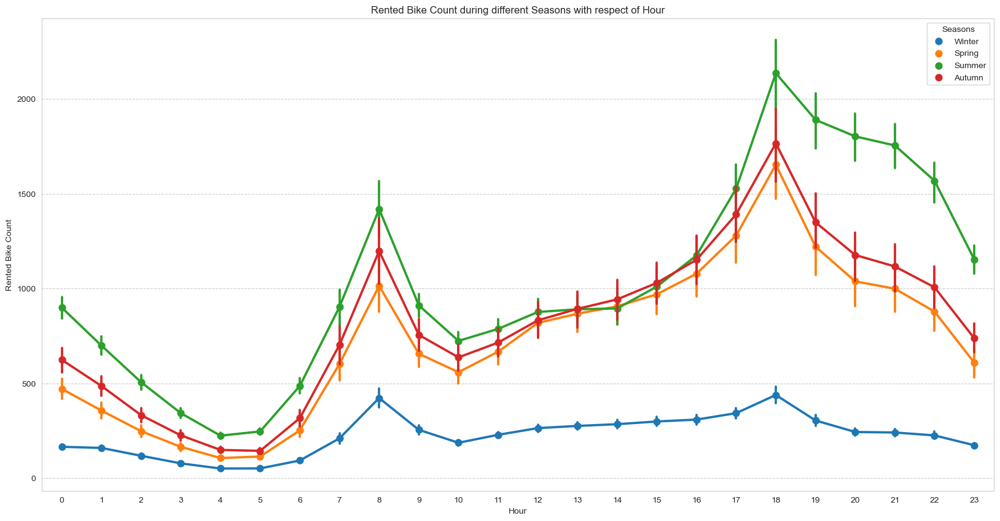

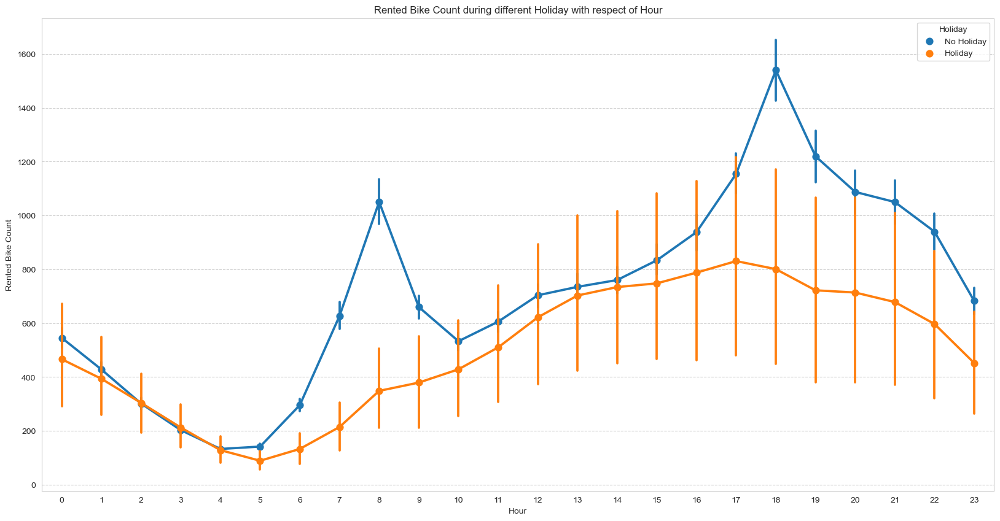

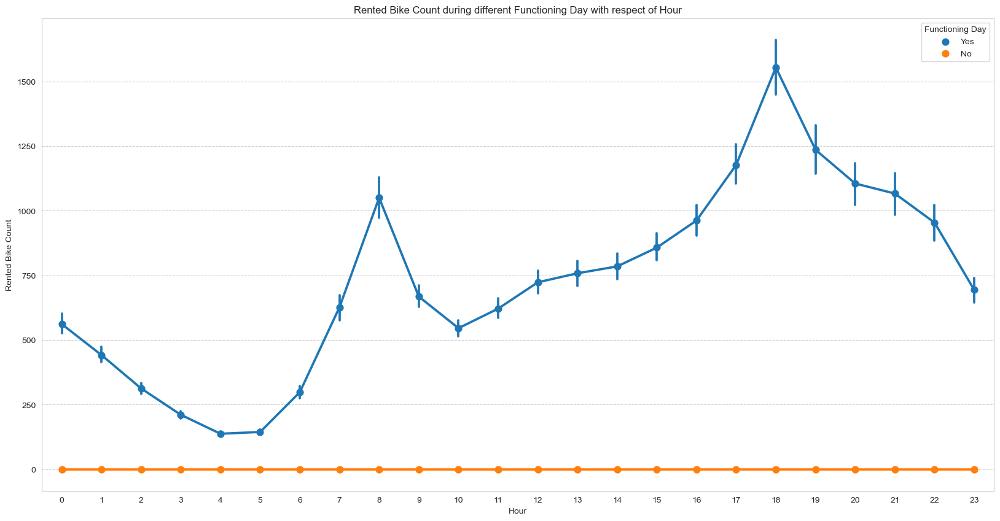

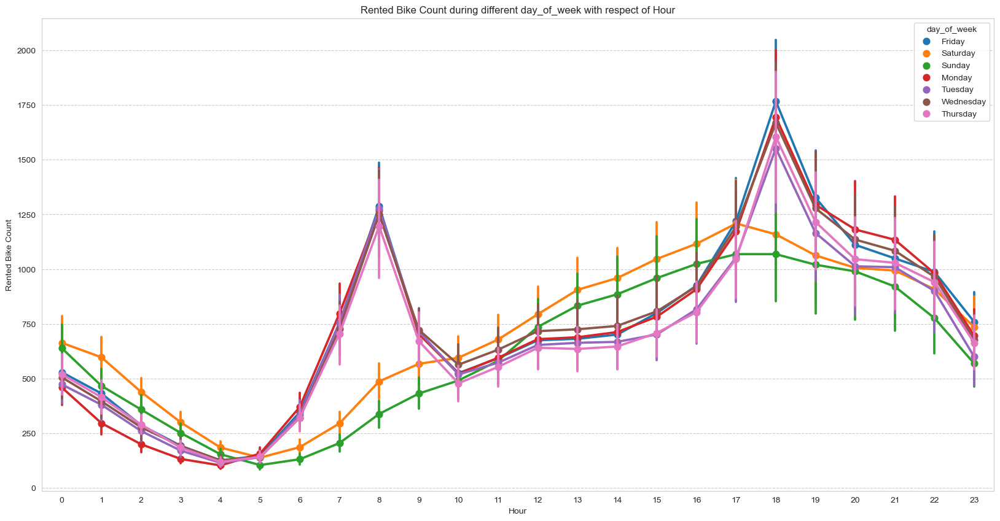

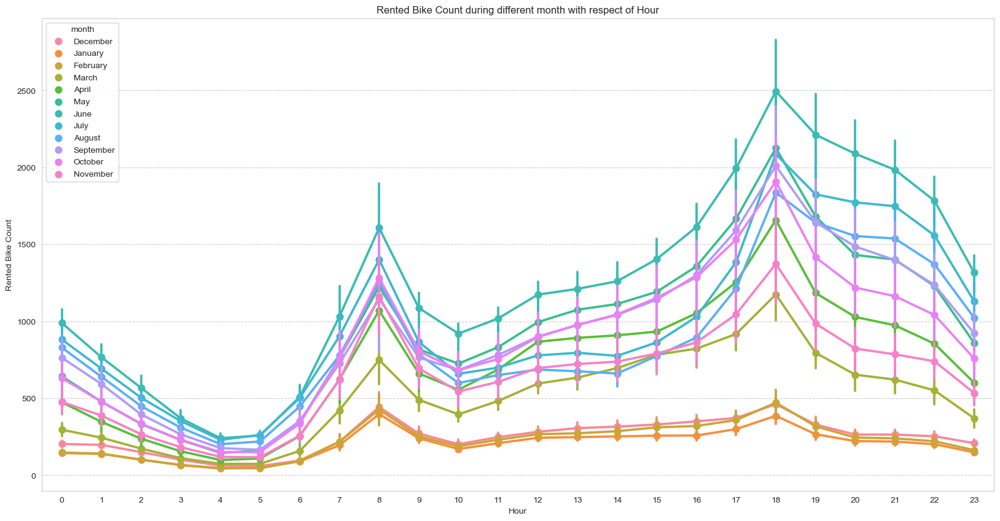

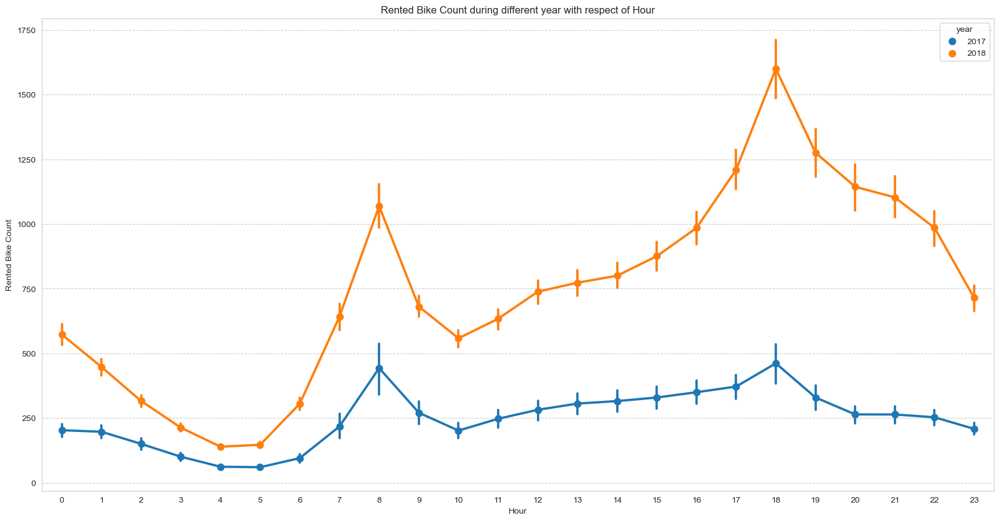

In [30]:
# we create point plots with Rented Bike Count during different categorical features with respect of Hour
for i in categorical_features.columns:
  if i == 'Hour':
    pass
  else:
    plt.figure(figsize=(20,10))
    sns.pointplot(x=df["Hour"],y=df['Rented Bike Count'],hue=df[i])
    plt.title(f"Rented Bike Count during different {i} with respect of Hour")
  plt.show()

<b> Observation 

From all these pointplot we have observed a lot from every column like :

*Season*

In the season column, we are able to understand that the demand is low in the winter season.

*Holiday*

In the Holiday column, The demand is low during holidays, but in no holidays the demand is high, it may be because people use bikes to go to their work.

*Functioning Day*

In the Functioning Day column, If there is no Functioning Day then there is no demand

*Days of week*

In the Days of week column, We can observe from this column that the pattern of weekdays and weekends is different, in the weekend the demand becomes high in the afternoon. While the demand for office timings is high during weekdays, **we can further change this column to weekdays and weekends.**

*month *

In the month column, We can clearly see that the demand is low in December January & Febuary, It is cold in these months and we have already seen in season column that demand is less in winters.

*year*

The demand was less in 2017 and higher in 2018, it may be because it was new in 2017 and people did not know much about it.

<b> Some more experiments for our categorical features 

In [33]:
# Converting days of weeks in Two variable from Monaday to Friday in Weekdays and Saturday and Sunday to Weekend
df['week'] = df['day_of_week'].apply(lambda x:'Weekend'  if x=='Saturday' or  x== 'Sunday' else 'Weekdays')

In [34]:
# value counts of Week column
df.week.value_counts()

week
Weekdays    6264
Weekend     2496
Name: count, dtype: int64

Text(0.5, 1.0, 'Rented Bike Count during weekday and weekend with respect of Hour')

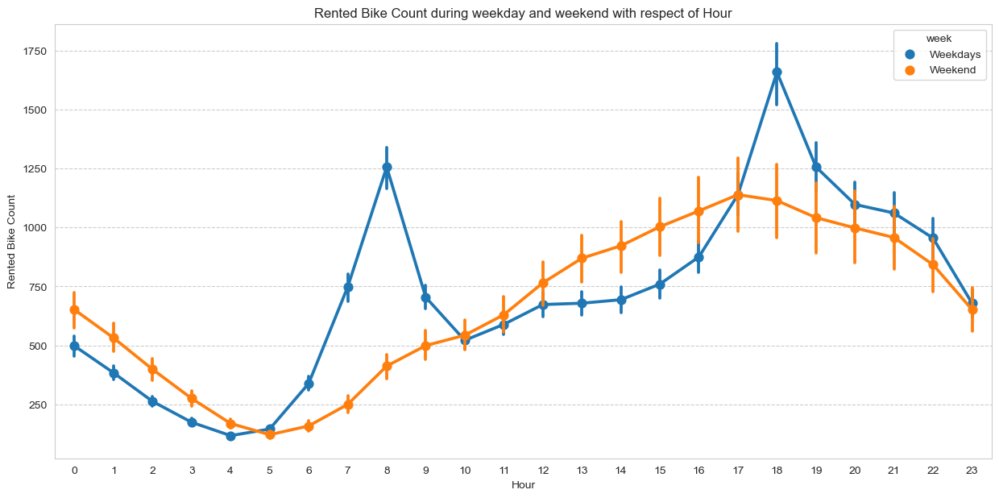

In [35]:
# Getting feel of week column with pointplot  
plt.figure(figsize=(15,7))
sns.pointplot(x=df["Hour"],y=df['Rented Bike Count'],hue=df['week'])
plt.title("Rented Bike Count during weekday and weekend with respect of Hour")

<b>Now we can clearly see the pattern which shows that the demand is high in the afternoon on the weekend. While there is more demand during office hours in weekdays

<b>Now we can drop the days of week column

In [38]:
# droping the days of week column from df and from categorical feature 
df.drop(columns=['day_of_week'], inplace=True)
categorical_features.drop(columns=['day_of_week'], inplace=True)

<b> value Counts in percentage 

In [40]:
# using for loop and getting all value Counts in percentage of categorical features
for i in categorical_features.columns:
  print('feature name : ',i)
  print(df[i].value_counts(normalize=True))
  print('\n')

feature name :  Hour
Hour
0     0.041667
1     0.041667
22    0.041667
21    0.041667
20    0.041667
19    0.041667
18    0.041667
17    0.041667
16    0.041667
15    0.041667
14    0.041667
13    0.041667
12    0.041667
11    0.041667
10    0.041667
9     0.041667
8     0.041667
7     0.041667
6     0.041667
5     0.041667
4     0.041667
3     0.041667
2     0.041667
23    0.041667
Name: proportion, dtype: float64


feature name :  Seasons
Seasons
Spring    0.252055
Summer    0.252055
Autumn    0.249315
Winter    0.246575
Name: proportion, dtype: float64


feature name :  Holiday
Holiday
No Holiday    0.950685
Holiday       0.049315
Name: proportion, dtype: float64


feature name :  Functioning Day
Functioning Day
Yes    0.966324
No     0.033676
Name: proportion, dtype: float64


feature name :  month
month
December     0.084932
January      0.084932
March        0.084932
May          0.084932
July         0.084932
August       0.084932
October      0.084932
April        0.082192
June

<b> lets take a visualization of value counts 



====================================================================== Hour ======================================================================




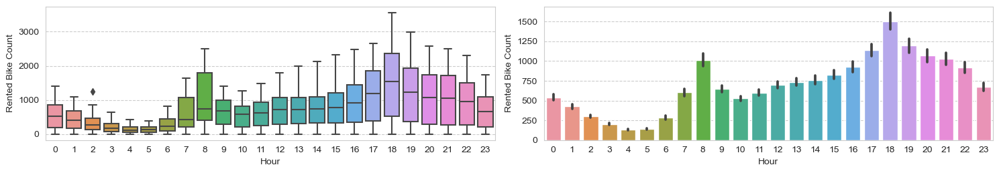



====================================================================== Seasons ======================================================================




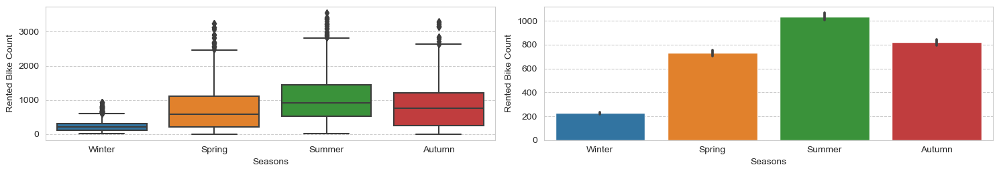



====================================================================== Holiday ======================================================================




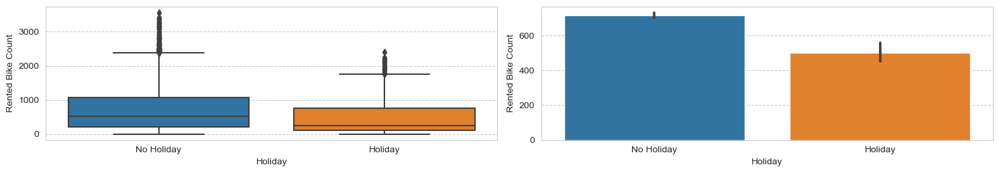



====================================================================== Functioning Day ======================================================================




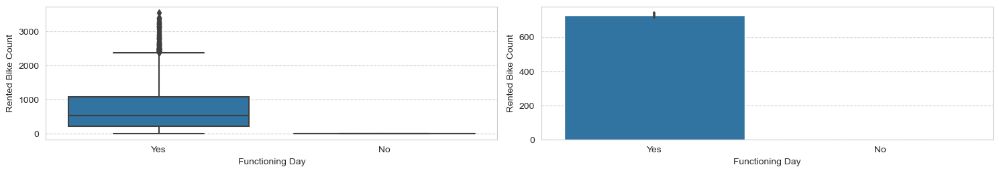



====================================================================== month ======================================================================




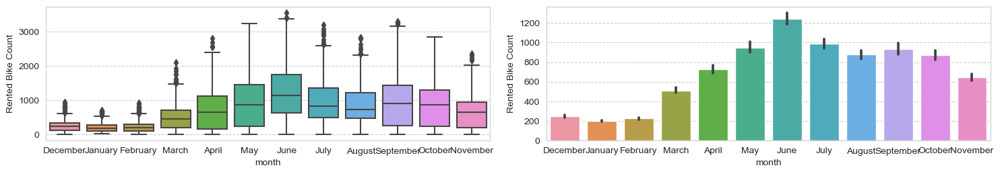



====================================================================== year ======================================================================




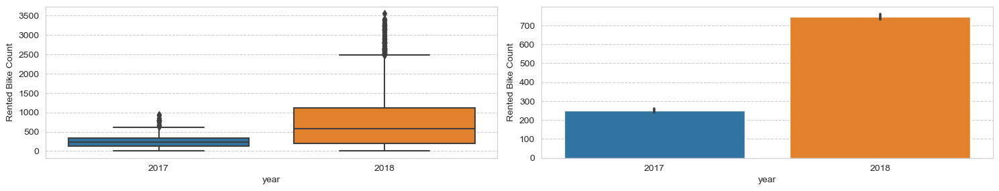

In [42]:
# creating boxplot plot and bar plot
n=1
for i in categorical_features.columns:
  plt.figure(figsize=(15,15))
  plt.subplot(6,2,n)
  n+=1
  print('\n')
  print('='*70,i,'='*70)
  print('\n')
  sns.boxplot(x=df[i],y=df["Rented Bike Count"])
  plt.subplot(6,2,n)
  n+= 1
  sns.barplot(x=df[i], y=df['Rented Bike Count'])
  plt.tight_layout()
  plt.show()

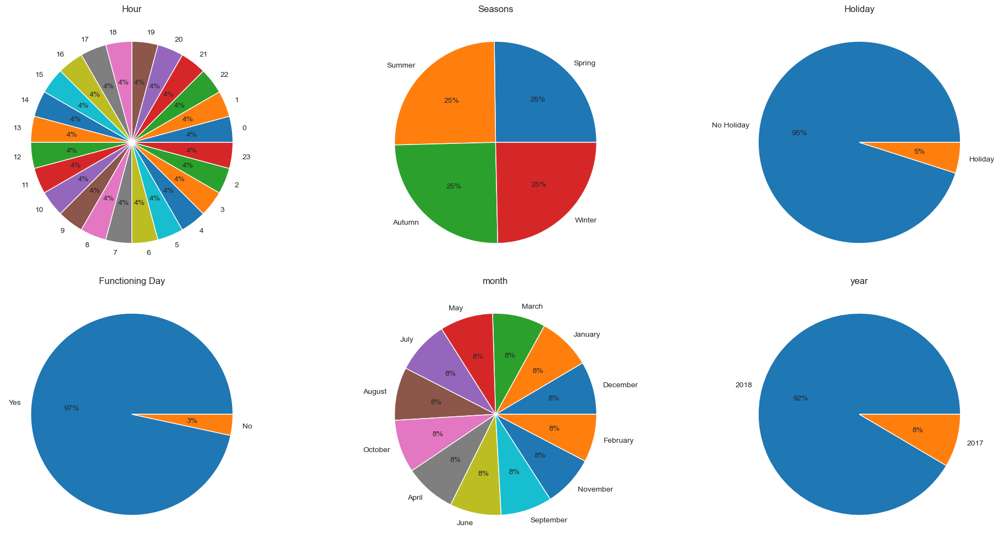

In [43]:
# creating pieplot for all categorical feature
n=1
plt.figure(figsize=(20,15))
for i in categorical_features.columns:
  plt.subplot(3,3,n)
  n=n+1
  plt.pie(df[i].value_counts(),labels = df[i].value_counts().keys().tolist(),autopct='%.0f%%')
  plt.title(i)
  plt.tight_layout()

##<b> Numeric features

<b> Now the time of Explore our numerical feature and Trying to take some important information from the Numeical feature

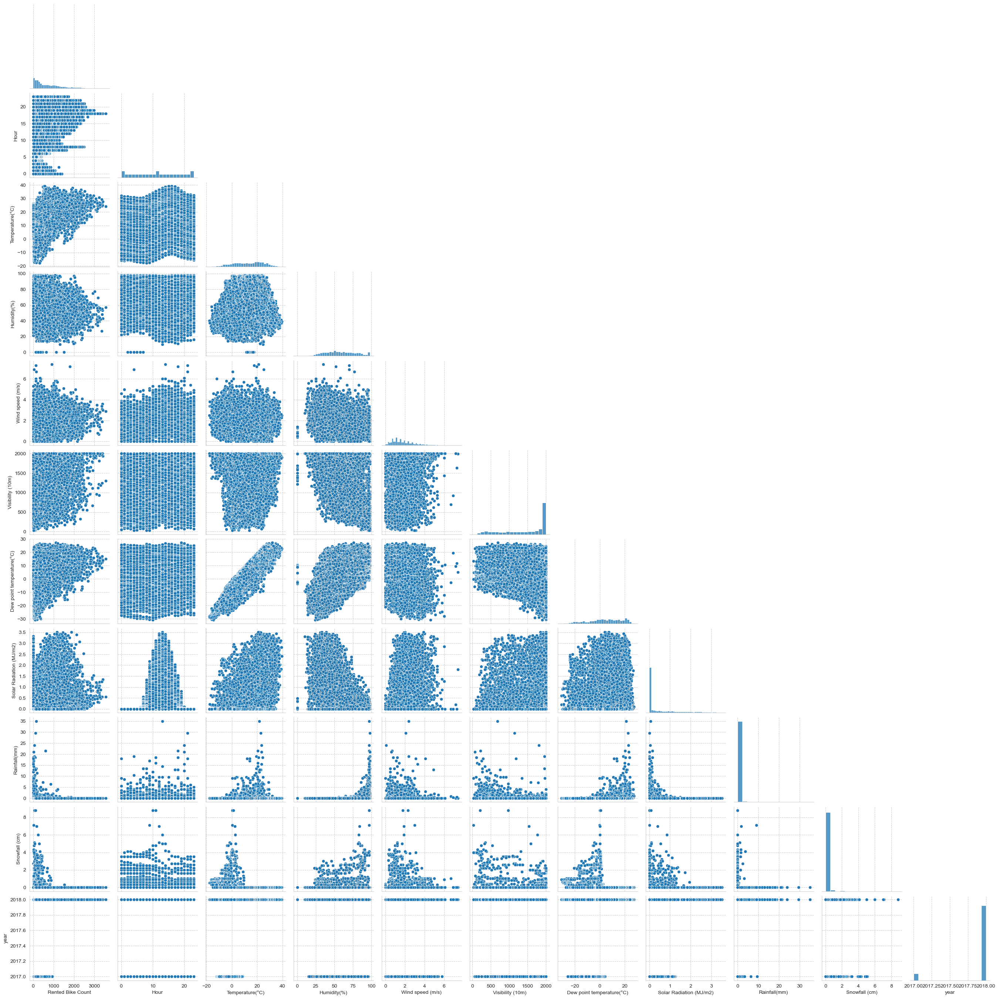

In [46]:
#ploting pairplot for more info
sns.pairplot(df, corner=True)

<b> Very less columns are linearly related with our dependent variable

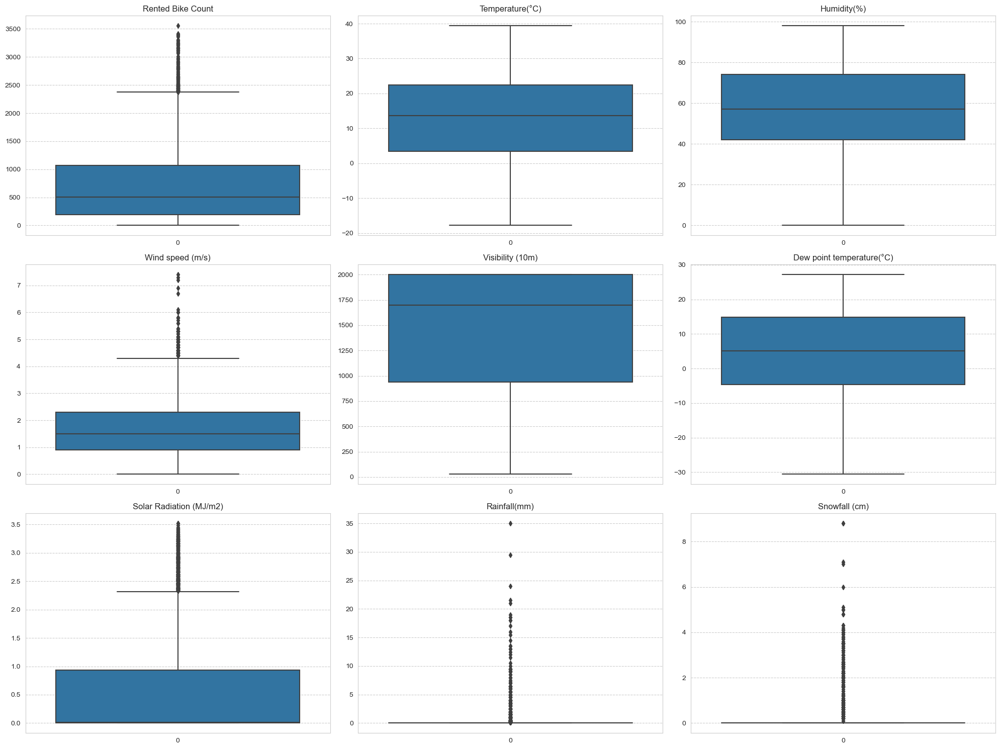

In [48]:
# checking Outliers with seaborn boxplot
n = 1
plt.figure(figsize=(20,15))

for i in numeric_features.columns:
  plt.subplot(3,3,n)
  n=n+1
  sns.boxplot(df[i])
  plt.title(i)
  plt.tight_layout()

We don't have to worry about outliers in this data, because When we are treating the outlires from Rainfall and snowfall columns using IQR its removed all the information of the data and all values became 0 

<b> *Pays little attention to the skewness of our numerical features*

##<b> Let's try something else to get information from our Numerical features



====================================================================== Rented Bike Count ======================================================================




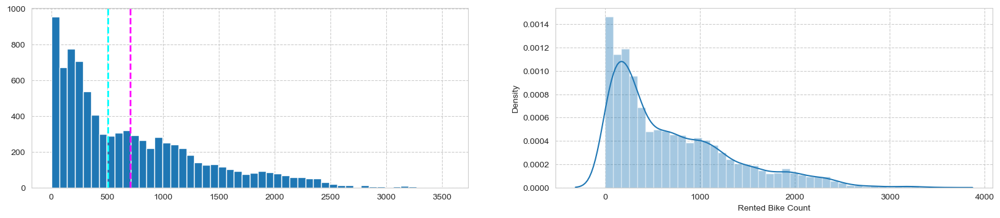



====================================================================== Temperature(°C) ======================================================================




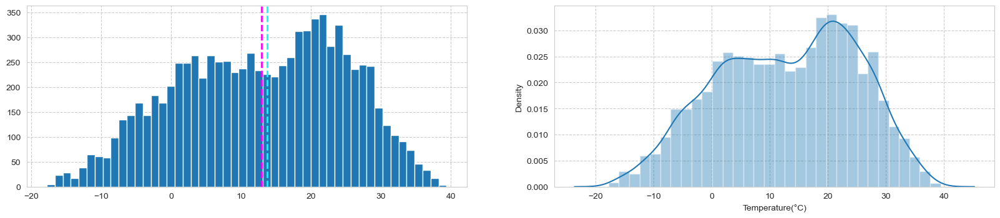



====================================================================== Humidity(%) ======================================================================




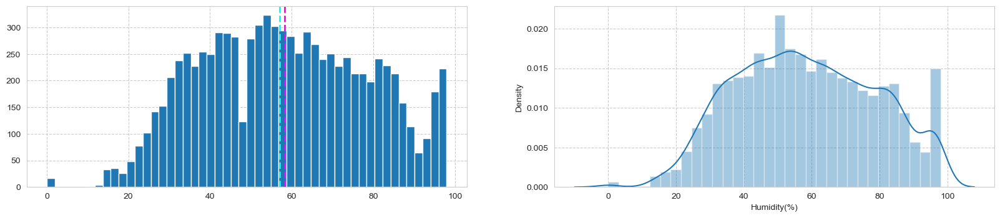



====================================================================== Wind speed (m/s) ======================================================================




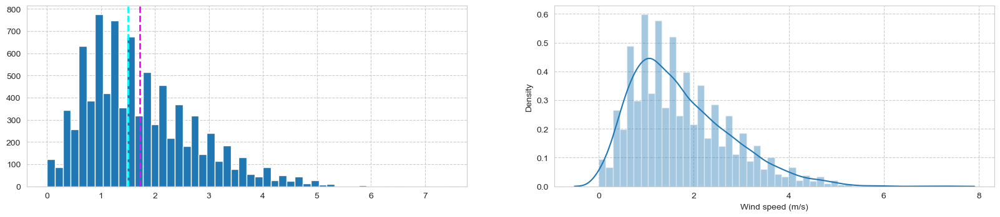



====================================================================== Visibility (10m) ======================================================================




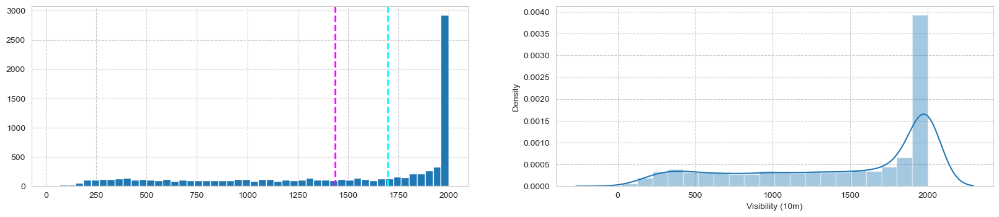



====================================================================== Dew point temperature(°C) ======================================================================




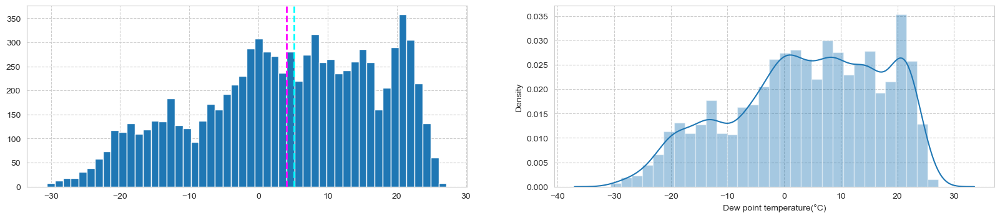



====================================================================== Solar Radiation (MJ/m2) ======================================================================




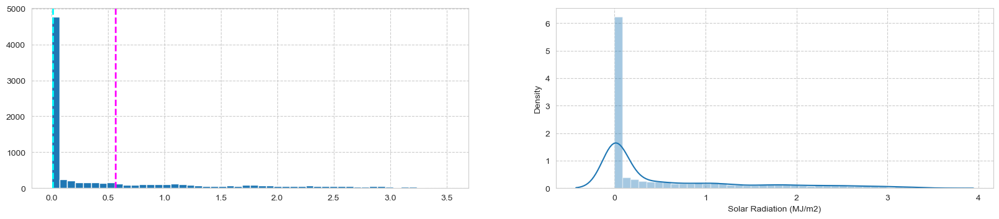



====================================================================== Rainfall(mm) ======================================================================




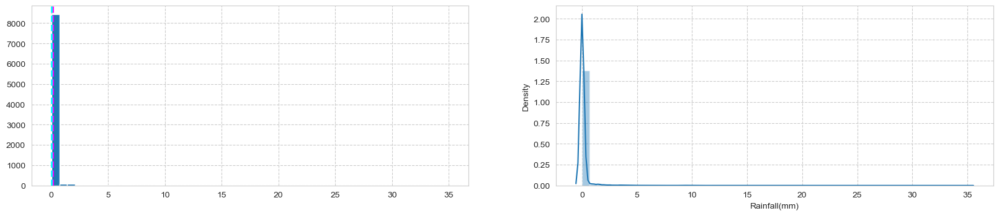



====================================================================== Snowfall (cm) ======================================================================




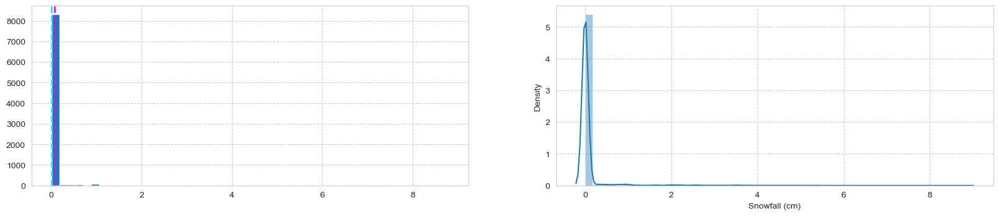

In [52]:
#plotting histogram with mean and median, and distplot of all the numeric features of the dataset
n=1
for i in numeric_features.columns:
  plt.figure(figsize=(20,40))
  plt.subplot(9,2,n)
  n+=1
  print('\n')
  print('='*70,i,'='*70)
  print('\n')
  # fig=plt.figure()
  # ax=fig.gca()
  feature=df[i]
  feature.hist(bins=50,)
  plt.axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2)
  plt.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2) 
  plt.subplot(9,2,n)
  n+= 1
  sns.distplot(df[i])
  # plt.tight_layout()
  plt.show()


<b>In Distplot plots we observe that some of our columns is right skewed and some are left skewed we have to remember this things when we apply algorithms

<b>Right skewed columns are

<b>Rented Bike Count (Its also our Dependent variable), 
<b>Wind speed (m/s),
<b>Solar Radiation (MJ/m2),
<b>Rainfall(mm),
<b>Snowfall (cm),

<b>Left skewed columns are

Visibility (10m), 
Dew point temperature(°C)

<b>From Histogram we are coming to know that the features which are skewed, their mean and the median are also skewed, which was understood by looking at the graph that this would happen.

<b> *Lets try to find how is the relation of numerical features with our dependent variable*

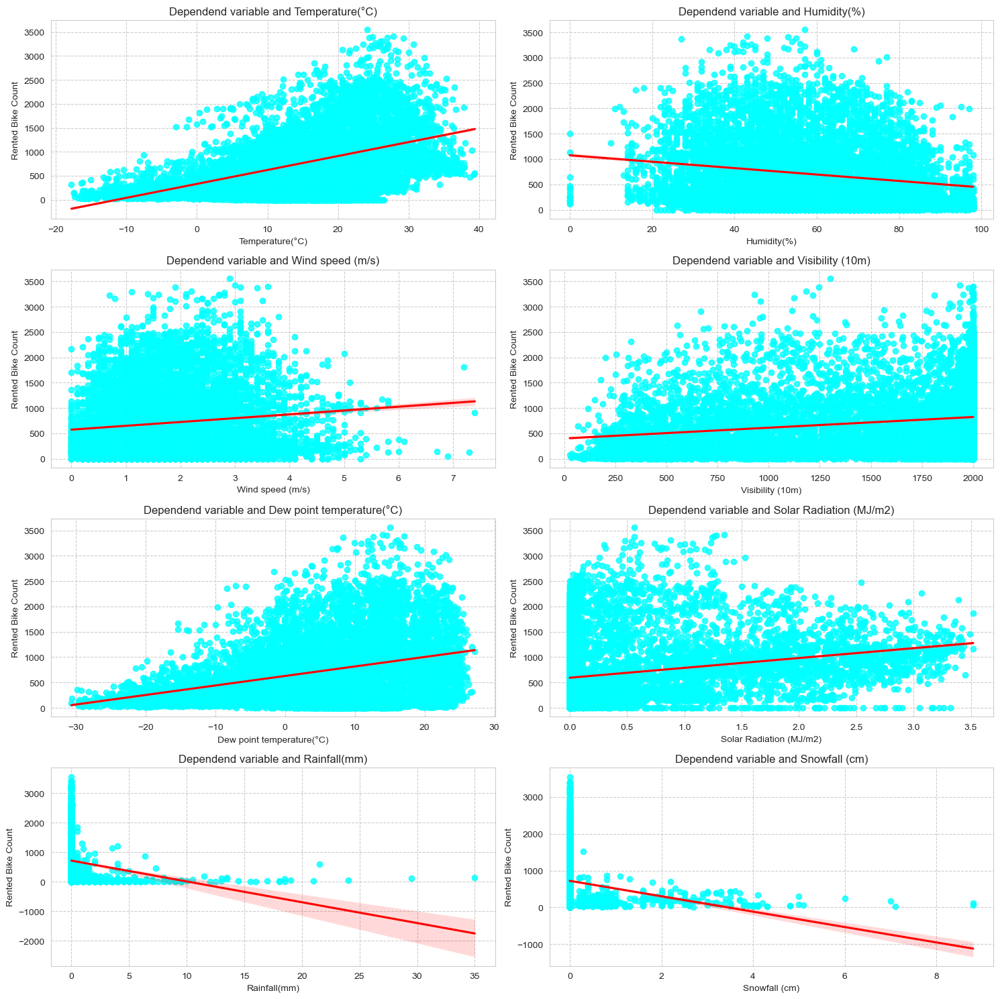

In [55]:
# Regression plot to know relation with our independent variable
n=1
plt.figure(figsize=(15,15))
for i in numeric_features.columns:
  if i == 'Rented Bike Count':
    pass
  else:
    plt.subplot(4,2,n)
    n+=1
    sns.regplot(x=df[i], y=df['Rented Bike Count'], scatter_kws={"color": "cyan"}, line_kws={"color": "red"})
    plt.title(f'Dependend variable and {i}')
    plt.tight_layout()

<b>This regression plots shows that some of our features are positive linear and some are negative linear in relation to our target variable.

#<b> Correlation

<b> Now is the time to know what is the correlation of our dependent variable with the independent features

In [59]:
numeric_df = df.select_dtypes(include='number')
correlation_with_rented_bike_count = numeric_df.corr()['Rented Bike Count']

<b>As we saw in the regression plot that some features are negatively correlated and some positive, we are seeing the same thing here as well.

<b>*Let us see the correlation of all the numerical features with the heat map, so that we will also get to know the multicolinearity.*

<Axes: >

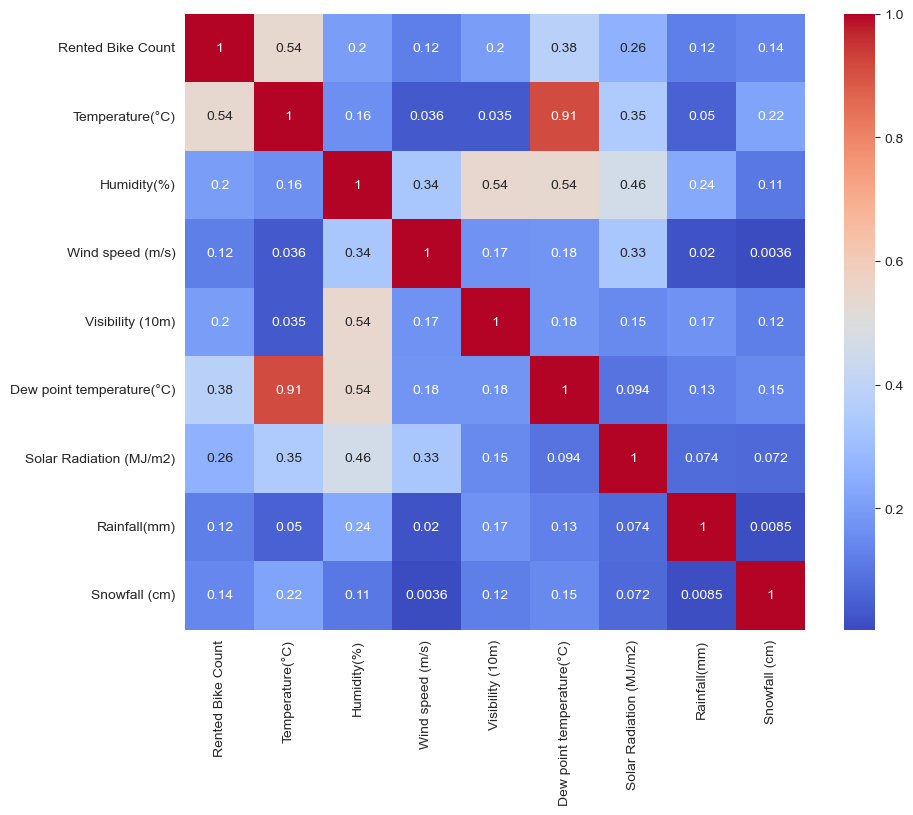

In [62]:
# using seaborn heatmap for ploting correlation graph 
plt.figure(figsize=(10,8))
sns.heatmap(abs(numeric_df.corr()), cmap='coolwarm', annot=True)

<b>From this graph we are able to see that there is multicollinearity in temperature(°C) and dev point temperature(°C) column.

In [64]:
#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
 
   # Calculating VIF
   vif = pd.DataFrame()
   vif["variables"] = X.columns
   vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
 
   return(vif)

In [65]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Rented Bike Count','Dew point temperature(°C)']]])

,variables,VIF
0,Temperature(°C),3.166007
1,Humidity(%),4.758651
2,Wind speed (m/s),4.079926
3,Visibility (10m),4.409448
4,Solar Radiation (MJ/m2),2.246238
5,Rainfall(mm),1.078501
6,Snowfall (cm),1.118901


#<b> Prepare data for model building

In [67]:
# Using Pandas get Dummies for Encoding categorical features 
new_df=pd.get_dummies(df,drop_first=True,sparse=True)

In [68]:
new_df.head(2)

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Hour_1,...,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September,year_2018,week_Weekend
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,False,...,False,False,False,False,False,False,False,False,False,False
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,True,...,False,False,False,False,False,False,False,False,False,False


<b> We saw that our dependent variable is right skewed, it needs to be normalized.


*We do some experiments to normalize it*

Text(0.5, 1.0, 'Square root')

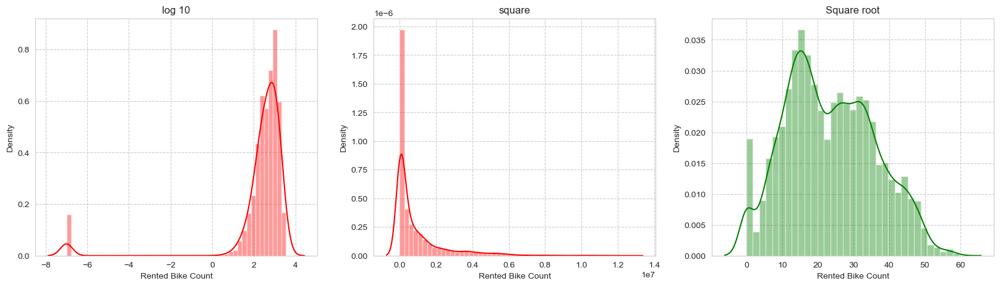

In [70]:
fig,axes = plt.subplots(1,3,figsize=(20,5))
# here we use log10 
sns.distplot(np.log10(new_df['Rented Bike Count']+0.0000001),ax=axes[0],color='red').set_title("log 10")
# here we use square 
sns.distplot((new_df['Rented Bike Count']**2),ax=axes[1],color='red').set_title("square")
# here we use square root 
sns.distplot(np.sqrt(new_df['Rented Bike Count']),ax=axes[2], color='green').set_title("Square root")

<b>Our dependent variable in green plot is normalized to some extent: so we will go with square root on our dependent variable

<b>*Divide data in dependent feature and Independent feature*

In [73]:
X = new_df.drop(columns=['Rented Bike Count','Dew point temperature(°C)'])
y = np.sqrt(new_df['Rented Bike Count'])

In [74]:
# Train test split our data
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.25,random_state=42)

<b>*Geeting Feel of my X_train, X_test, y_train, y_test*

In [76]:
X_train.head()

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Hour_1,Hour_2,Hour_3,...,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September,year_2018,week_Weekend
2223,16.0,14,2.2,1828,2.33,0.0,0.0,False,False,False,...,False,False,False,True,False,False,False,False,True,True
798,-6.7,48,2.4,1991,0.00,0.0,0.0,False,False,False,...,True,False,False,False,False,False,False,False,True,False
7752,11.3,71,1.2,1997,0.00,0.0,0.0,False,False,False,...,False,False,False,False,False,False,True,False,True,True
734,3.0,28,3.8,1956,1.10,0.0,0.0,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2881,11.5,77,2.0,593,0.00,0.0,0.0,True,False,False,...,False,False,False,True,False,False,False,False,True,True


In [77]:
X_test.head()

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Hour_1,Hour_2,Hour_3,...,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September,year_2018,week_Weekend
6056,27.2,69,1.8,1999,0.70,0.0,0.0,False,False,False,...,False,False,False,False,False,False,False,False,True,False
5556,32.6,51,2.1,800,3.21,0.0,0.0,False,False,False,...,False,True,False,False,False,False,False,False,True,False
5990,34.0,50,1.2,1744,1.68,0.0,0.0,False,False,False,...,False,False,False,False,False,False,False,False,True,False
7674,16.9,47,1.4,1637,0.11,0.0,0.0,False,False,False,...,False,False,False,False,False,False,True,False,True,False
3319,6.4,51,1.0,1398,0.19,0.0,0.0,False,False,False,...,False,False,False,False,False,False,False,False,True,False


In [78]:
y_train.head()

2223    35.185224
798     11.704700
7752    29.849623
734     16.186414
2881    22.405357
Name: Rented Bike Count, dtype: float64

In [79]:
y_test.head()

6056    41.569219
5556    28.670542
5990    25.651511
7674    52.115257
3319    32.908965
Name: Rented Bike Count, dtype: float64

In [80]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6570, 48), (2190, 48), (6570,), (2190,))

#<b> Defining Functions

<b>Defining a function to train and evaluate the model with Diffrent parameters like MSE , RMSE, R2 Score, Best_params, Best score, Coefficient , intercept and feature importance  

In [83]:
# Appending all models evalution scores to the corrosponding list after hyperarameter
mean_absolut_error_ht = []
mean_sq_error_ht=[]
root_mean_sq_error_ht=[]
training_score_ht =[]
r2_list_ht=[]
adj_r2_list_ht=[]

In [84]:
# creating a function for fit, predict and evaluting the models and append all evalution score in list 

def score_metrix (model,X_train,X_test,Y_train,Y_test, linear = False):

  '''
    train the model and gives mae, mse,rmse,r2,adj r2 score of the model
    
  '''
  #training the model
  model.fit(X_train,Y_train)

  # Training Score
  training  = model.score(X_train,Y_train)
  print('*'*30, 'Training score', '*'*30)
  print("Training score  =", training)

  print('\n')

  try:
      # finding the best parameters of the model if any 
    print('*'*20, 'Best Parameters & Best Score', '*'*20)
    print(f"The best parameters found out to be :{model.best_params_} \nwhere model best score is:  {model.best_score_} \n")
  except:
    print('None')
    
    

  #predicting the Test set and evaluting the models 
  print('\n')
  print('*'*20, 'Evalution Matrix', '*'*20)

  if linear == True:
    Y_pred = model.predict(X_test)

    #finding mean_absolute_error
    MAE  = mean_absolute_error(Y_test**2,Y_pred**2)
    print("MAE :" , MAE)

    #finding mean_squared_error
    MSE  = mean_squared_error(Y_test**2,Y_pred**2)
    print("MSE :" , MSE)

    #finding root mean squared error
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)

    #finding the r2 score
    
    r2 = r2_score(Y_test**2,Y_pred**2)
    print("R2 :" ,r2)
    #finding the adjusted r2 score
    adj_r2=1-(1-r2_score(Y_test**2,Y_pred**2))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    print("Adjusted R2 : ",adj_r2,'\n')
  
  else:
    # for tree base models
    Y_pred = model.predict(X_test)

    #finding mean_absolute_error
    MAE  = mean_absolute_error(Y_test,Y_pred)
    print("MAE :" , MAE)

    #finding mean_squared_error
    MSE  = mean_squared_error(Y_test,Y_pred)
    print("MSE :" , MSE)

    #finding root mean squared error
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)

    #finding the r2 score
    
    r2 = r2_score(Y_test,Y_pred)
    print("R2 :" ,r2)
    #finding the adjusted r2 score
    adj_r2=1-(1-r2_score(Y_test,Y_pred))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    print("Adjusted R2 : ",adj_r2,'\n')

    #Top 10 feature importance graph
    try:
      best = model.best_estimator_
      features = new_X.columns
      importances = best.feature_importances_[0:10]
      indices = np.argsort(importances)
      plt.figure(figsize=(10,15))
      plt.title('Feature Importance')
      plt.barh(range(len(indices)), importances[indices], color='pink',edgecolor='red' ,align='center')
      plt.yticks(range(len(indices)), [features[i] for i in indices])
      plt.xlabel('Relative Importance')
      plt.show()
    
    except:
      pass
  
  # Here we appending the parameters for all models 
  mean_absolut_error_ht.append(MAE)
  mean_sq_error_ht.append(MSE)
  root_mean_sq_error_ht.append(RMSE)
  training_score_ht.append(training)
  r2_list_ht.append(r2)
  adj_r2_list_ht.append(adj_r2)

  
  # print the cofficient and intercept of which model have these parameters and else we just pass them
  if model == Linear:
    print("*"*25, "coefficient", "*"*25)
    print(model.coef_)
    print('\n')
    print("*"*25, "Intercept", "*"*25)
    print('\n')
    print(model.intercept_)
  else:
    pass
  print('\n')
  
  print('*'*20, 'ploting the graph of Actual and predicted only with 80 observation', '*'*20)

  # ploting the graph of Actual and predicted only with 80 observation for better visualisation which model have these parameters and else we just pass them
  try:
    # ploting the line graph of actual and predicted values  
    plt.figure(figsize=(15,7))
    plt.plot((Y_pred)[:80])
    plt.plot((np.array(Y_test)[:80]))
    plt.legend(["Predicted","Actual"])
    plt.show()
  except:
    pass



##<b> Defining Functions for model explainability

###<b> Lime

In [87]:

def model_explainability_lime(model,num_features,row_number):
  test = pd.DataFrame(X_test)
  lime_explainer = lime_tabular.LimeTabularExplainer(
      training_data = X_train_scaled,
      feature_names = new_X.columns.values,
      mode = 'regression',
      verbose=True,
      random_state =42 )

  lime_exp = lime_explainer.explain_instance(
      data_row = X_test.iloc[row_number],
      predict_fn = model.predict,num_features=num_features,
  )
  return lime_exp.show_in_notebook(show_table=True,)

###<b>Shap

In [89]:
def model_explainability_shap(model,for_instance):
  # Initialize JavaScript visualizations in notebook environment
  shap.initjs()
  # Define a tree explainer for the built model
  explainer = shap.TreeExplainer(model)
  # obtain shap values for the first row of the test data
  shap_values = explainer(X_test,check_additivity=False)
  # visualize the first prediction's explanation with a force plot
  return shap.plots.force(shap_values[for_instance])

<b>Transforming X_train and X_test with yeo-johnson transformation




In [91]:
from sklearn.preprocessing import PowerTransformer,MinMaxScaler
yeo = PowerTransformer()
X_train_trans = yeo.fit_transform(X_train) # fit transform the training set
X_test_trans = yeo.transform(X_test) #tranform the test set

#<b> All linear models score without hyperparameter tuning and save them in blank list

In [93]:
mean_absolut_error = []
mean_sq_error=[]
root_mean_sq_error=[]
training_score =[]
r2_list=[]
adj_r2_list=[]

# assigning models in variables
lr= LinearRegression()
l2 = Ridge()
l1 = Lasso()
sgd = SGDRegressor()


linear_models = [lr,l1,l2,sgd]
for i in linear_models:
  i.fit(X_train_trans,y_train)
  y_pred = i.predict(X_test_trans)
  mae = mean_absolute_error(y_test,y_pred)
  mse = mean_squared_error(y_test,y_pred)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test,y_pred)
  ad_r2 =1-(1-r2)*((X_test_trans.shape[0]-1)/(X_test_trans.shape[0]-X_test_trans.shape[1]-1))

  training_score.append(i.score(X_train_trans,y_train))
  mean_absolut_error.append(mae)
  mean_sq_error.append(mse)
  root_mean_sq_error.append(rmse)
  r2_list.append(r2)
  adj_r2_list.append(ad_r2)


#<b>Linear Models with Hyperparameter

##<b> Linear Regression

In [96]:
# imporing linear models
from sklearn.linear_model import LinearRegression,Lasso,Ridge
Linear = LinearRegression()

****************************** Training score ******************************
Training score  = 0.8090578689067067


******************** Best Parameters & Best Score ********************
None


******************** Evalution Matrix ********************
MAE : 195.73171385512205
MSE : 82087.34965453463
RMSE : 286.5088997824232
R2 : 0.7993960106991029
Adjusted R2 :  0.7948985835685831 

************************* coefficient *************************
[ 4.88304341e+00 -1.27578167e+00 -6.85072767e-02  4.36600060e-01
  2.95847965e+00 -2.97380116e+00  4.40880906e-03 -4.62759782e-01
 -1.07979925e+00 -1.42581277e+00 -2.04411968e+00 -1.94619525e+00
 -9.71135968e-01 -5.91353385e-04  8.77624868e-01 -4.62480637e-01
 -1.44417941e+00 -1.48322460e+00 -1.29223122e+00 -1.25714114e+00
 -1.20553296e+00 -1.00486059e+00 -6.15076555e-01  3.32108332e-01
  1.71521181e+00  1.32129470e+00  1.29246636e+00  1.36632357e+00
  9.90693433e-01  3.13779449e-01 -7.80512598e+11  4.21377223e+11
 -4.60441655e+12  6.90007526e

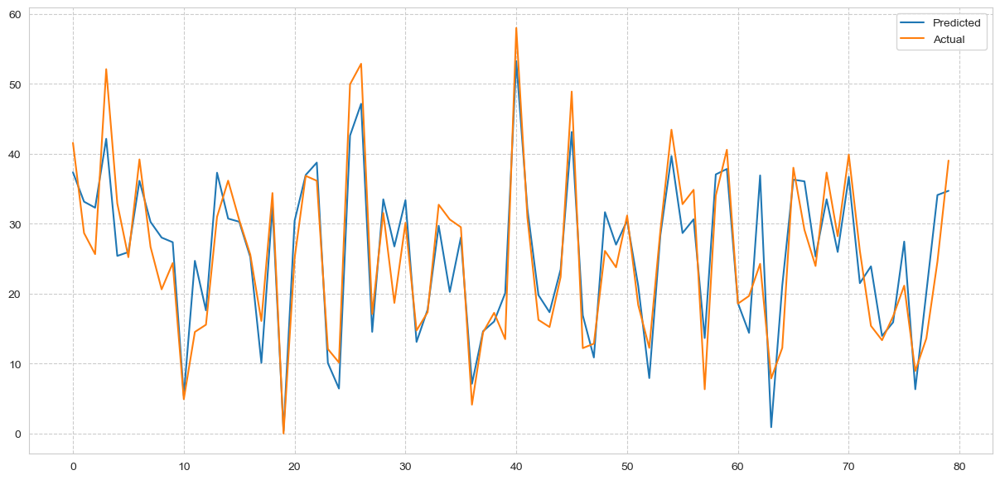

In [97]:
# importing Fitting the linear regression model with our score matrix function 
score_metrix(Linear,X_train_trans,X_test_trans,y_train,y_test,linear=True)

##<b> Regularization

### Lasso

In [100]:
# importing Lasso from sklearn
from sklearn.linear_model import Lasso

In [101]:
# Using Grid Search CV for Hyperparameter tuning for Lasso Regression
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]} #lasso parameters 
L1 = GridSearchCV(Lasso(), parameters, cv=5) #using gridsearchcv and cross validate the model


****************************** Training score ******************************
Training score  = 0.8090555455823615


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'alpha': 0.0014} 
where model best score is:  0.8057077152228864 



******************** Evalution Matrix ********************
MAE : 195.7966482795977
MSE : 82170.42846443261
RMSE : 286.6538478102686
R2 : 0.7991929837922526
Adjusted R2 :  0.7946910049141713 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


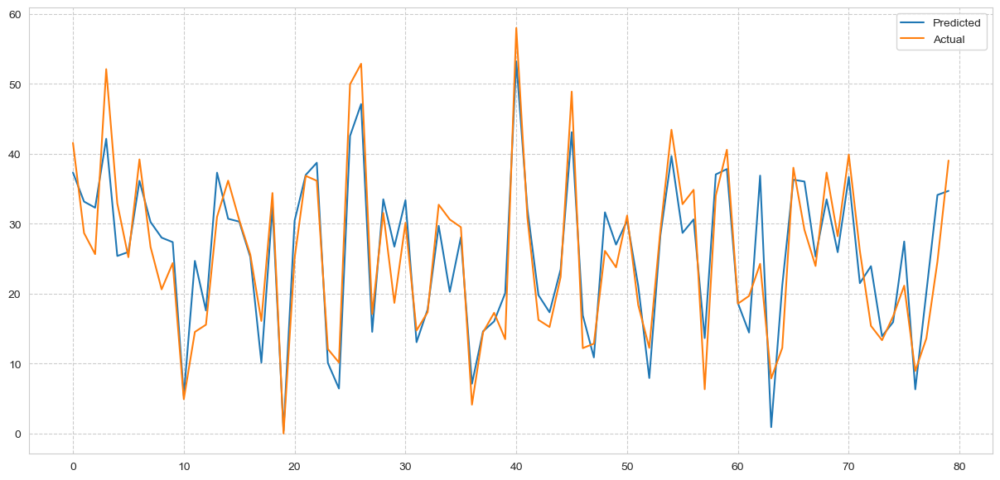

In [102]:
# fit and evaluate model with score_matrix function
score_metrix(L1,X_train_trans,X_test_trans,y_train,y_test,linear=True)

###<b> Ridge

In [104]:
# # importing Lasso from sklearn
from sklearn.linear_model import Ridge

In [105]:
# Using Grid Search CV for Hyperparameter tuning for Lasso Regression
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100,0.5,1.5,1.6,1.7,1.8,1.9]} # giving parameters 
L2 = GridSearchCV(Ridge(), parameters, scoring='r2', cv=5) #using gridsearchcv and cross validate the model

****************************** Training score ******************************
Training score  = 0.8090572517937475


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'alpha': 1.7} 
where model best score is:  0.8057029532825212 



******************** Evalution Matrix ********************
MAE : 195.75297894427493
MSE : 82106.72088225963
RMSE : 286.54270341828567
R2 : 0.7993486715466557
Adjusted R2 :  0.7948501830993131 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


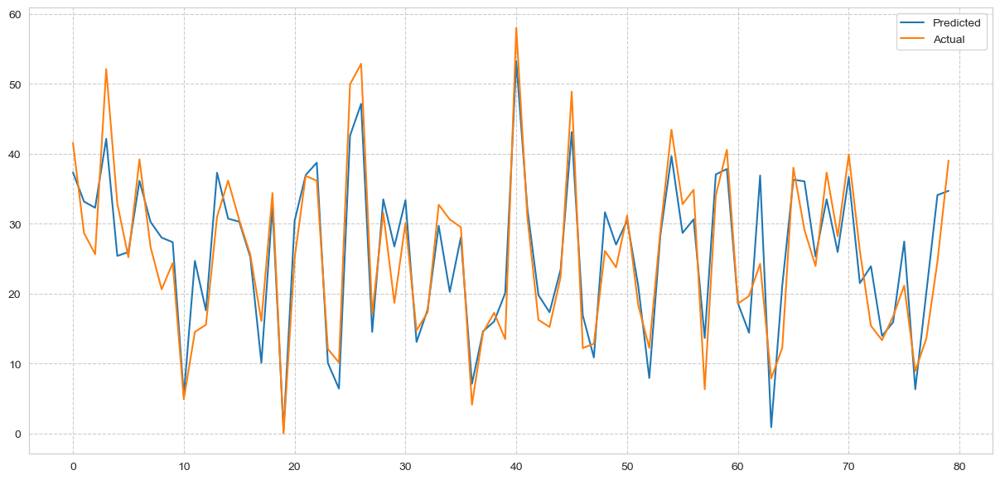

In [106]:
# fit and evaluate model with score_matrix function
score_metrix(L2,X_train_trans,X_test_trans,y_train,y_test,linear=True)

##<b> Polynomial 

In [108]:
# importing polynominal features from sklearn
from sklearn.preprocessing import PolynomialFeatures

In [109]:
poly = PolynomialFeatures(2) #creating variable with degree 2
poly_X_train = poly.fit_transform(X_train_trans) # fit the train set
poly_X_test = poly.transform(X_test_trans) #transform the test set

****************************** Training score ******************************
Training score  = 0.9430400564761591


******************** Best Parameters & Best Score ********************
None


******************** Evalution Matrix ********************
MAE : 107.75353499812215
MSE : 32332.42001651601
RMSE : 179.81217983361418
R2 : 0.920986455691873
Adjusted R2 :  0.8205802401550933 

************************* coefficient *************************
[-6.05695589e+08  1.76351396e+00 -1.52704478e+00 ...  2.89266742e+11
 -3.45495424e+10 -3.93653716e+10]


************************* Intercept *************************


-983640881118.7996


******************** ploting the graph of Actual and predicted only with 80 observation ********************


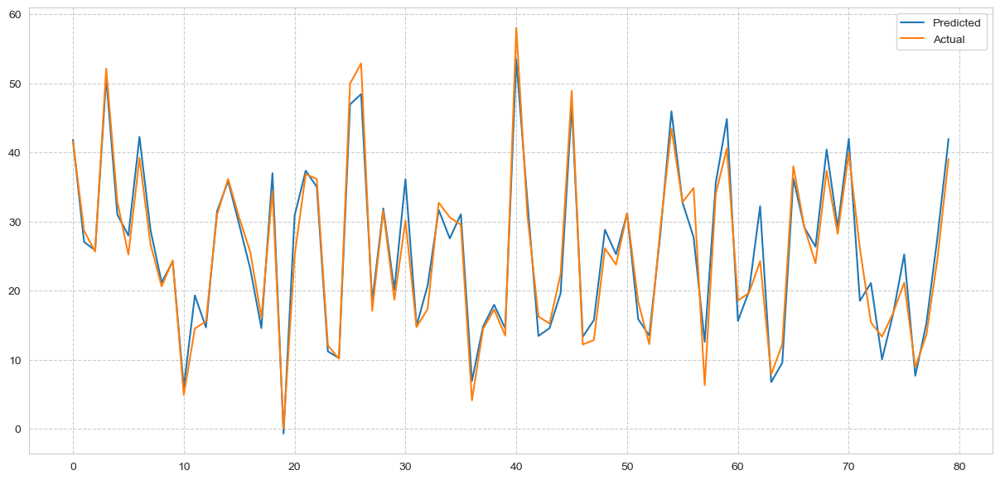

In [110]:
# fit and evaluate model with score_matrix function
score_metrix(Linear, poly_X_train,poly_X_test,y_train,y_test,linear=True)

##<b> Stochastic Gradient Descent Regressor 

In [112]:
# import SGD Regressor from sklearn
from sklearn.linear_model import SGDRegressor

In [113]:
# Parameters for Grid search
params = {'penalty':['l2'],# 'l1', 'elasticnet'],
          'alpha' : [0.0001],#0.01,0.1],
          'max_iter':[1000],#800,1200],
          'learning_rate':['invscaling'],#'constant','optimal']

          }

In [114]:
# Creating variable of gridesearch
sgd_grid= GridSearchCV(SGDRegressor(),param_grid=params,cv=2,verbose=True)

Fitting 2 folds for each of 1 candidates, totalling 2 fits
****************************** Training score ******************************
Training score  = 0.8073309971677832


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'alpha': 0.0001, 'learning_rate': 'invscaling', 'max_iter': 1000, 'penalty': 'l2'} 
where model best score is:  0.8025392185403334 



******************** Evalution Matrix ********************
MAE : 4.014942517235466
MSE : 27.903727900559225
RMSE : 5.282397930917286
R2 : 0.8156290040992367
Adjusted R2 :  0.8114955114307469 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


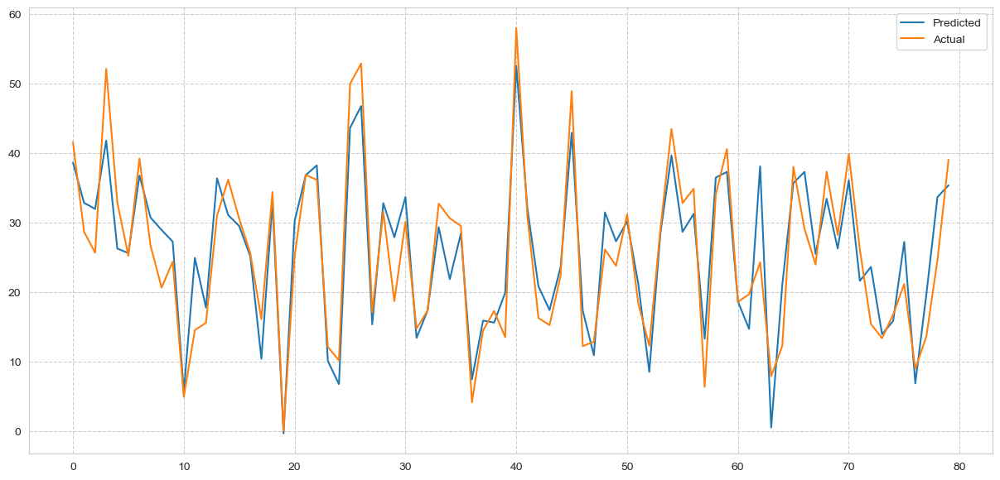

In [115]:
#calling function score matrix and evaluating model
score_metrix(sgd_grid,X_train_trans,X_test_trans,y_train,y_test)

#<b> Train Test split for Tree Base Models
<b> Here we use all independent features because multicollinearty not effecting tree base models. 
And we are not transforming our dependent variable because distribution of the dependent variable not effect the model accuracy 

In [117]:
# Creating DataFrame for tree base models
tree_df = pd.get_dummies(df,columns=['Seasons','Holiday','Functioning Day','month','year','week'],drop_first=True)

In [118]:
# Split data in X and Y
new_X = tree_df.drop(columns='Rented Bike Count')
new_y = tree_df['Rented Bike Count']

In [119]:
# Train test split our data
X_train,X_test,y_train,y_test = train_test_split(new_X,new_y, test_size=0.25,random_state=42)

In [120]:
# Scalling data with yeo-johnson
scaler = MinMaxScaler()

In [121]:
X_train_scaled  = scaler.fit_transform(X_train) #fitting the X_train
X_test_scaled  = scaler.transform(X_test) # transform test set

#<b> All tree base models score without hyperparameter tuning and append them on pre defined metrices list

In [123]:
# assigning models in variables
decision_tree= DecisionTreeRegressor()
random_forest = RandomForestRegressor()
bagging = BaggingRegressor()
graidient_boost = GradientBoostingRegressor()
xg_boost = XGBRegressor()

tree_base_models = [decision_tree,random_forest,bagging,graidient_boost,xg_boost]
for i in tree_base_models:
  i.fit(X_train_scaled,y_train)
  y_pred = i.predict(X_test_scaled)
  mae = mean_absolute_error(y_test,y_pred)
  mse = mean_squared_error(y_test,y_pred)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test,y_pred)
  ad_r2 =1-(1-r2)*((X_test_scaled.shape[0]-1)/(X_test_scaled.shape[0]-X_test_scaled.shape[1]-1))

  training_score.append(i.score(X_train_scaled,y_train))
  mean_absolut_error.append(mae)
  mean_sq_error.append(mse)
  root_mean_sq_error.append(rmse)
  r2_list.append(r2)
  adj_r2_list.append(ad_r2)

##<b> Without hyperparameter tuning all models evalution matrices dataframe

In [125]:
# creating a Data frame of tree base model scores without hyperparameter tuning
model_names = ['Linear Regression','Ridge','Lasso','SGD regression','Decision_Tree','Random_Forest','Bagging','Graidient_boost','xg_boost']
#creating dictionary to store all the metrices 
all_matrices={'Mean_Absolute_error':mean_absolut_error,'Mean_square_error':mean_sq_error,'Root_Mean_square_error':root_mean_sq_error,'Training_score':training_score,'R2':r2_list,'Adjusted_R2':adj_r2_list}
#converting dictionary to dataframe for simple visualization 
matrices=pd.DataFrame.from_dict(all_matrices,orient='index',columns=model_names)

In [126]:
# Adjusted R2 score is set in descending order 
matrices_df_without_hp = matrices.transpose().sort_values("Adjusted_R2",ascending=False).reset_index().rename(columns={'index':'model'})

In [127]:
#matrices dataframe
matrices_df_without_hp

,model,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,xg_boost,102.216059,28781.862901,169.652182,0.987328,0.929663,0.928785
1,Random_Forest,103.009027,31311.685426,176.951082,0.990019,0.923481,0.922525
2,Bagging,110.082694,34423.227986,185.534978,0.985046,0.915877,0.914826
3,Decision_Tree,135.674429,58446.338356,241.756775,1.000000,0.857170,0.855386
4,Graidient_boost,165.741473,64881.829801,254.719119,0.871735,0.841443,0.839463
5,Lasso,4.044736,28.020982,5.293485,0.809057,0.814854,0.810703
6,Linear Regression,4.044633,28.021024,5.293489,0.809058,0.814854,0.810703
7,SGD regression,4.066261,28.129057,5.303683,0.808148,0.814140,0.809973
8,Ridge,5.453423,48.849630,6.989251,0.667818,0.677231,0.669995


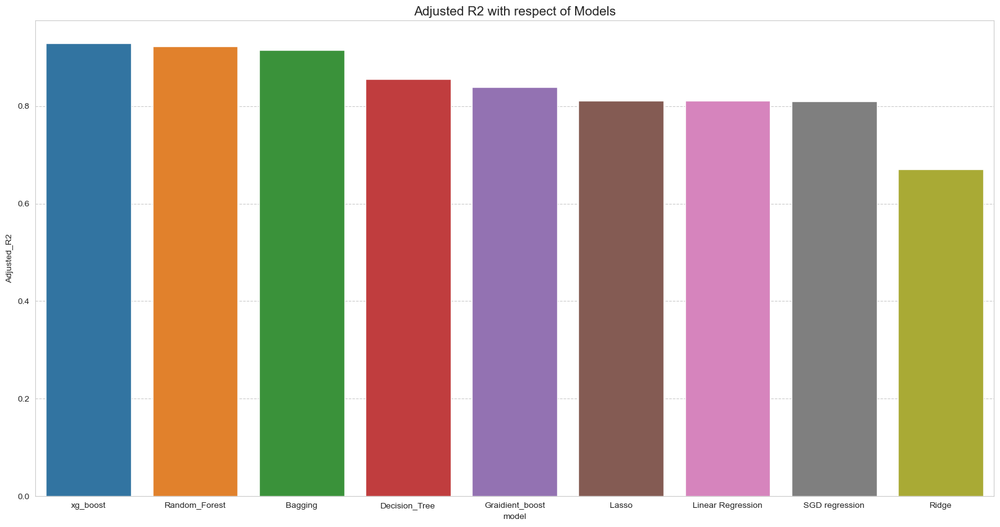

In [128]:
plt.figure(figsize=(20,10))
sns.barplot(y='Adjusted_R2', x = 'model', data=matrices_df_without_hp)
plt.title("Adjusted R2 with respect of Models",fontsize=15)
plt.show()

#<b>Tree base Models with Hyperparameter tuning

## <b> Decission Tree 


In [131]:
from sklearn.tree import DecisionTreeRegressor

# Corrected criterion parameter value
model = DecisionTreeRegressor(criterion='mse')  # or any other valid criterion


In [132]:
# Parameters for Decission Tree model
param_grid = {'criterion':['mse','squared_error', 'absolute_error',],
              'min_samples_leaf':[5],#7,10],
              'max_depth' : [18],#10,25],
              'min_samples_split': [25],#15,35],
              'max_features':['auto','sqrt','log2']
              }

# After finding the best parameters, we commented on all the other parameters for faster execution

In [133]:
# Using Grid Search 
Dt_grid_search = GridSearchCV(DecisionTreeRegressor(),param_grid=param_grid,cv=5,n_jobs=-1,)

****************************** Training score ******************************
Training score  = 0.7904384279112786


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'criterion': 'absolute_error', 'max_depth': 18, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 25} 
where model best score is:  0.7257581518037326 



******************** Evalution Matrix ********************
MAE : 198.8936073059361
MSE : 111087.59771689498
RMSE : 333.2980613758427
R2 : 0.7285255845432048
Adjusted R2 :  0.7251352935083605 



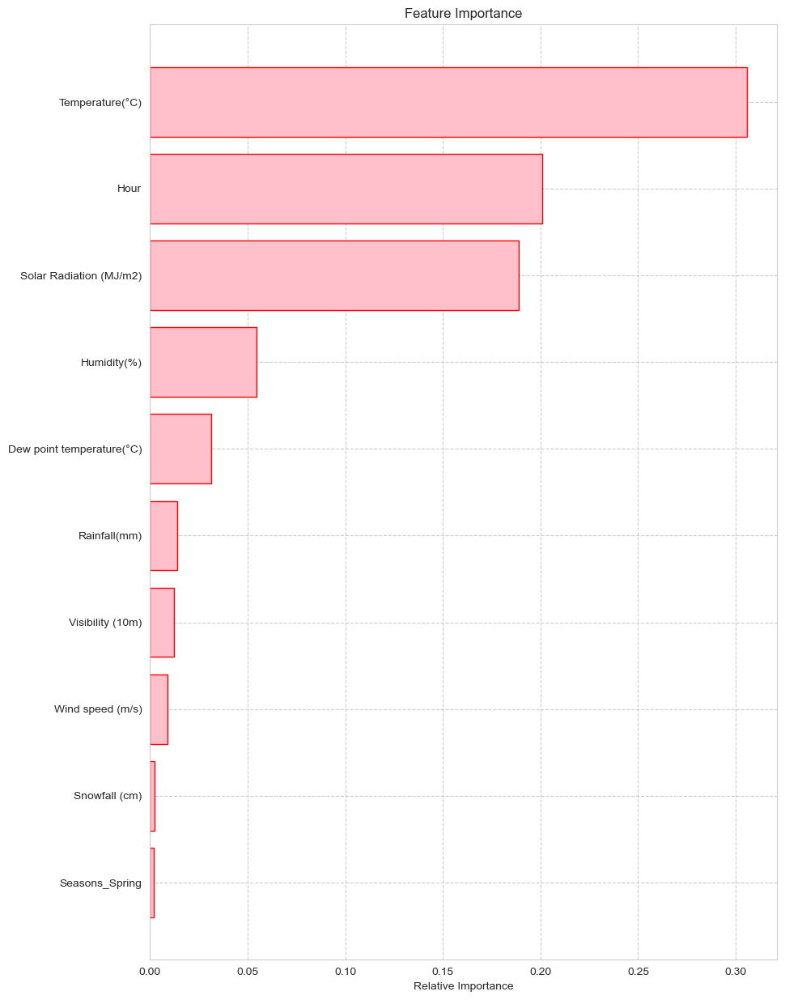



******************** ploting the graph of Actual and predicted only with 80 observation ********************


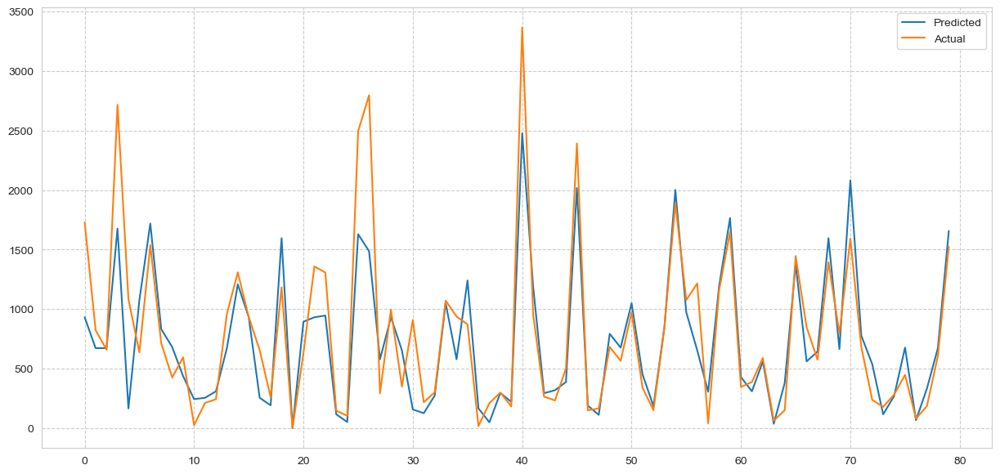

In [134]:
# fit and evaluate model with score_matrix function
score_metrix(Dt_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model explainability with LIME

In [136]:
# # Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(Dt_grid_search.best_estimator_,6,1)

Intercept 184.31179237891382
Prediction_local [1418.16622466]
Right: 931.0


###<b> Model explainability with SHAP

In [138]:
# Calling Function for model explainability with shap
model_explainability_shap(Dt_grid_search.best_estimator_,2)

**The base value:** The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

**Red/blue:** Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

##<b> RandomForest Regression

In [141]:
# Importing Randomfroest from sklearn.ensemble
from sklearn.ensemble import RandomForestRegressor

In [142]:
param_grid = {'n_estimators':[150],#100,200],
              'min_samples_leaf':[4],#6,2],
              'max_depth' : [20],#25,30],
              'min_samples_split': [25],#30,20],
              'max_features':['auto','sqrt','log2']
              }
# After finding the best parameters, we commented on all the other parameters for faster execution

In [143]:
# Using Grid SearchCV 
Ranom_forest_Grid_search = GridSearchCV(RandomForestRegressor(),param_grid=param_grid,n_jobs=-1,cv=5)

****************************** Training score ******************************
Training score  = 0.8936370403170197


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 25, 'n_estimators': 150} 
where model best score is:  0.8430801148618144 



******************** Evalution Matrix ********************
MAE : 166.03865672239615
MSE : 64379.71996668419
RMSE : 253.73159039954837
R2 : 0.8426696840652836
Adjusted R2 :  0.8407048743843228 



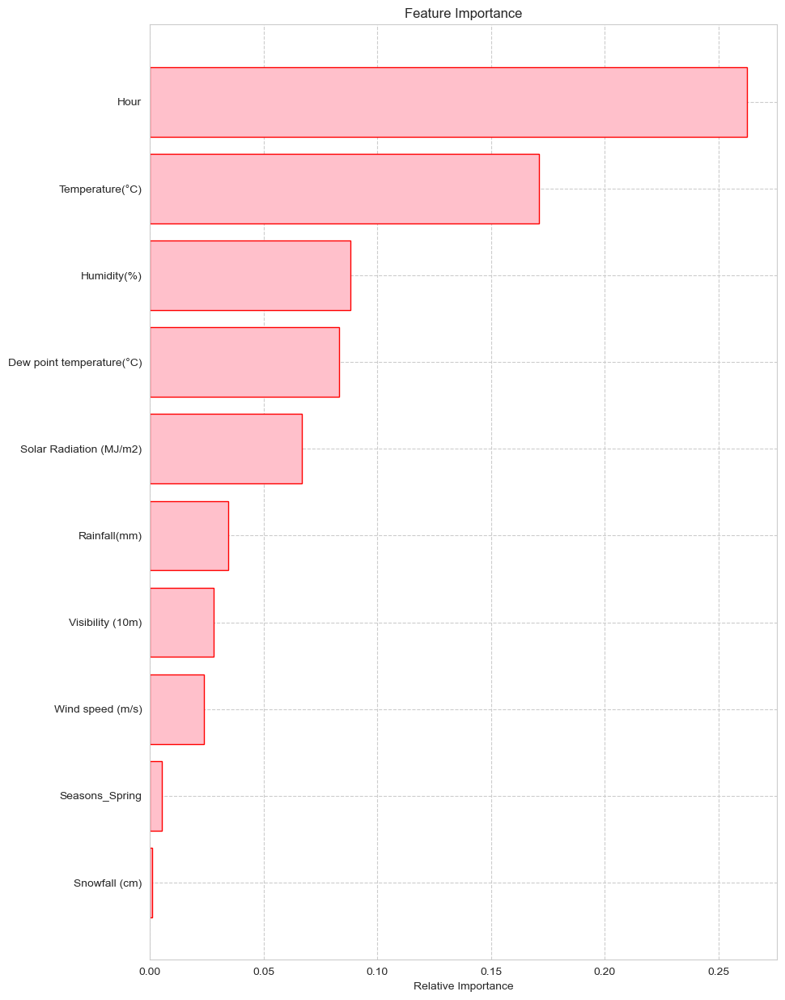



******************** ploting the graph of Actual and predicted only with 80 observation ********************


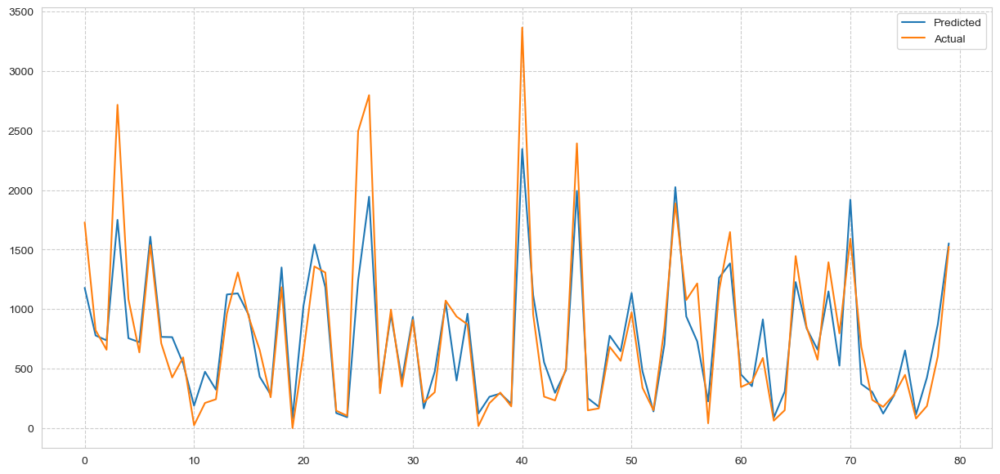

In [144]:
# fit and evaluate model with score_matrix function
score_metrix(Ranom_forest_Grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model explainability with lime 

In [146]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(Ranom_forest_Grid_search.best_estimator_,6,2)

Intercept 298.6756042577116
Prediction_local [1156.60777203]
Right: 988.020210904577


###<b> Model explainability with SHAP

In [148]:
# Calling our SHAP function 
model_explainability_shap(Ranom_forest_Grid_search.best_estimator_,2)

**The base value:** The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

**Red/blue:** Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

##<b> Bagging Regressor

In [151]:
# Importing Bagging from sklearn.ensemble
from sklearn.ensemble import BaggingRegressor

In [152]:
# parameters for Bagging
param_grid = {"n_estimators":[100],#,150,200],
              "bootstrap":[True,False],
              'max_samples' :[0.3],#,0.5,0.7,1.0],
              'max_features':[1.0],#0.3,0.5,0.7,]
              }

# After finding the best parameters, we commented on all the other parameters for faster execution

In [153]:
# Using Grid SearchCV 
Bagging_Grid_search = GridSearchCV(BaggingRegressor(),param_grid=param_grid,n_jobs=-1,cv=5)

****************************** Training score ******************************
Training score  = 0.958918207919126


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'bootstrap': False, 'max_features': 1.0, 'max_samples': 0.3, 'n_estimators': 100} 
where model best score is:  0.9077270133244995 



******************** Evalution Matrix ********************
MAE : 115.92047945205479
MSE : 38047.14434470319
RMSE : 195.0567721067464
R2 : 0.9070208872722095
Adjusted R2 :  0.9058597235147394 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


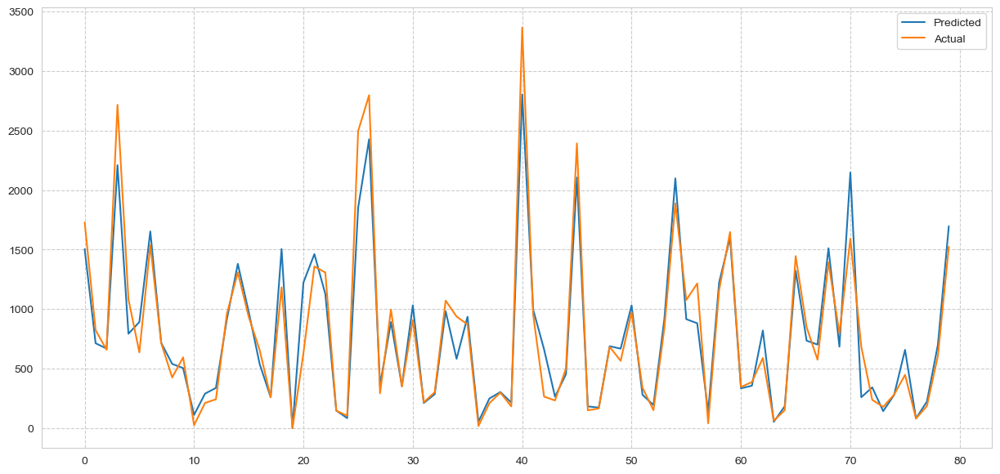

In [154]:
# fit and evaluate model with score_matrix function
score_metrix(Bagging_Grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model explainability with lime 

In [156]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(Bagging_Grid_search.best_estimator_,6,2)

Intercept 211.41520899414127
Prediction_local [1529.70603925]
Right: 986.56


##<b> Gradient Boosting Regressor

In [158]:
# Importing Gradient Boosting Regressor from sklearn.ensemble
from sklearn.ensemble import GradientBoostingRegressor 

In [159]:
# parameters for Gradient Boosting Regressor
param_grid={'loss':['huber','squared_error', 'absolute_error','quantile'],
            'min_impurity_decrease':[0.4],#0.2,0.6],
            'criterion':['friedman_mse', 'squared_error', 'mse','mae'],
            'n_estimators':[800],#600,400,1000], 
            'learning_rate': [0.01],#0.03,0.1,0.05], 
            'min_samples_leaf':[6],#4,8]
            'max_depth':[25],#15,20,30],
            'subsample':[0.7],#0.5,1.0],
            'max_leaf_nodes':[17],#15,10,20],
            'max_features':['auto','sqrt', 'log2'] 
            }
            
# After finding the best parameters, we commented on all the other parameters for faster execution

In [160]:
# Using grid search 
gradient_boost_grid_search = GridSearchCV(GradientBoostingRegressor(), param_grid=param_grid, n_jobs=-1,cv=5,verbose=2)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
****************************** Training score ******************************
Training score  = 0.9265976606668778


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'criterion': 'squared_error', 'learning_rate': 0.01, 'loss': 'squared_error', 'max_depth': 25, 'max_features': 'sqrt', 'max_leaf_nodes': 17, 'min_impurity_decrease': 0.4, 'min_samples_leaf': 6, 'n_estimators': 800, 'subsample': 0.7} 
where model best score is:  0.9047261850425231 



******************** Evalution Matrix ********************
MAE : 130.3279481984994
MSE : 41081.82722845239
RMSE : 202.68652453592566
R2 : 0.8996047690115366
Adjusted R2 :  0.8983509895311071 



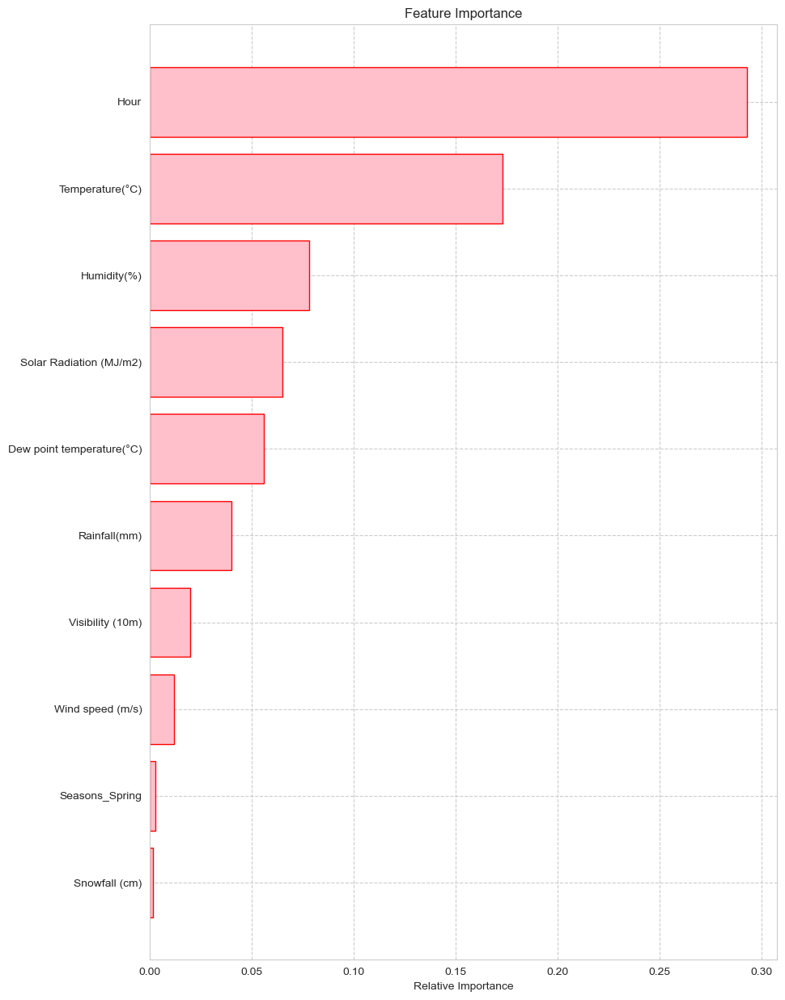



******************** ploting the graph of Actual and predicted only with 80 observation ********************


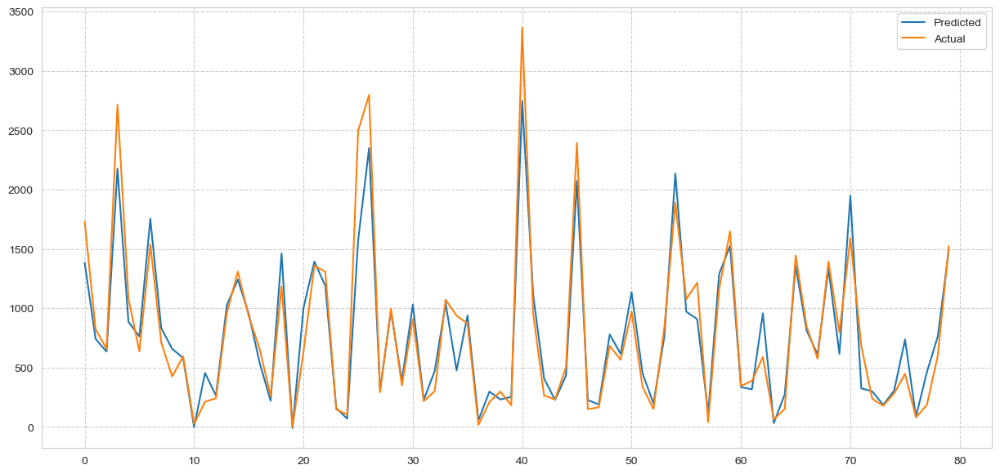

In [161]:
# fit and evaluate model with score_matrix function
score_metrix(gradient_boost_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model explainability with Lime

In [163]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(gradient_boost_grid_search.best_estimator_,6,2)

Intercept 60.048521784384434
Prediction_local [1359.41135765]
Right: 699.2588220799603


###<b> Model explainability with Shap

In [165]:
# Calling our SHAP function 
model_explainability_shap(gradient_boost_grid_search.best_estimator_,2)

**The base value:** The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

**Red/blue:** Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

##<b> Extreme Gradient Boosting

In [168]:
params = {
          'subsample': [0.5],#0.3,0.7], 
          'n_thread': [4], #2,6],
          'n_estimators': [1000],#range(200,1500,50), 
          'min_child_weight': [2],#3,5], 
          'max_depth': [4],#range(2,8,2), 
          'learning_rate': [0.02],#0.04,0.06], 
          'eval_mertric': ['rmse','mse',], 
          'colsample_bytree': [0.7],#0.5,1.0],  
          }

# After finding the best parameters, we commented on all the other parameters for faster execution

In [169]:
#creating xgb grid model
xgb_grid_search= GridSearchCV(XGBRegressor(silent=True),param_grid=params,cv=5)

****************************** Training score ******************************
Training score  = 0.947142262664991


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'colsample_bytree': 0.7, 'eval_mertric': 'rmse', 'learning_rate': 0.02, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 1000, 'n_thread': 4, 'subsample': 0.5} 
where model best score is:  0.9224589776312901 



******************** Evalution Matrix ********************
MAE : 115.7850016214804
MSE : 33954.124022745156
RMSE : 184.2664484455734
R2 : 0.9170233566944765
Adjusted R2 :  0.9159871081425575 



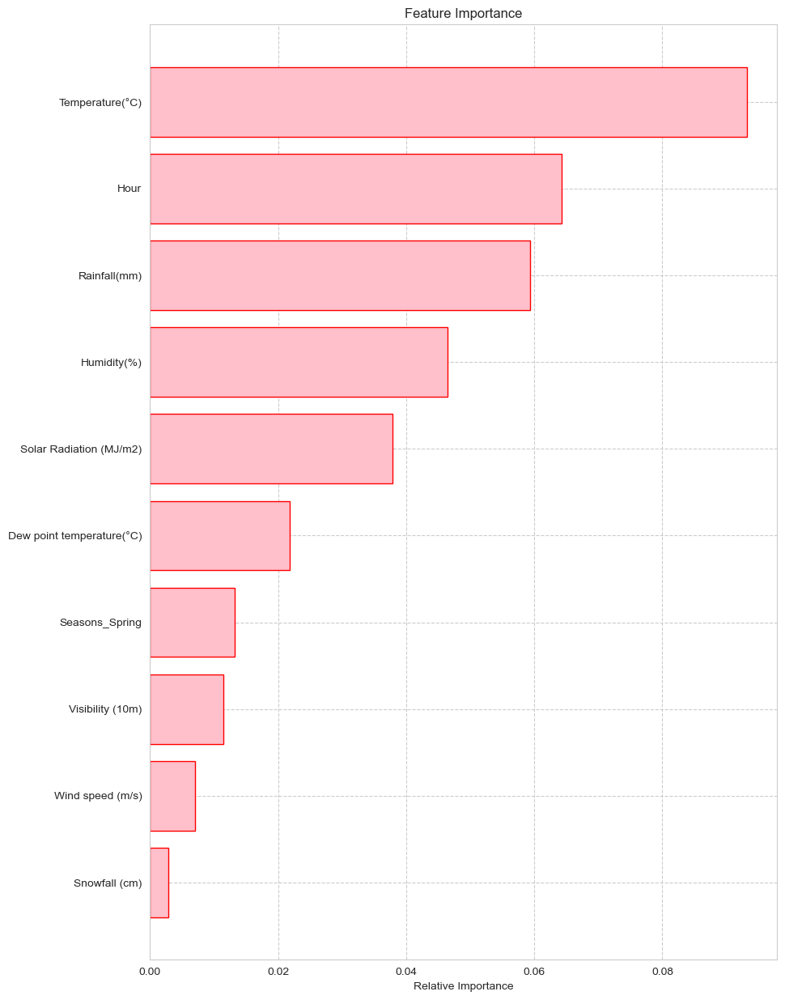



******************** ploting the graph of Actual and predicted only with 80 observation ********************


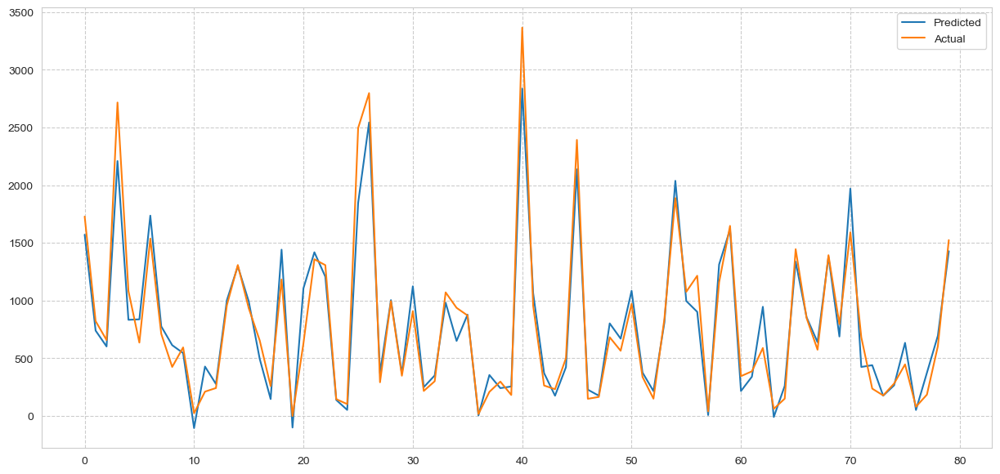

In [170]:
score_metrix(xgb_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model explainability with Lime

In [172]:
# Calling lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(xgb_grid_search.best_estimator_,6,2)

Intercept -285.47856002091567
Prediction_local [228.23695702]
Right: 563.60547


###<b> Model explainability with SHAP

In [174]:
# Calling shap function
#model_explainability_shap(xgb_grid_search.best_estimator_,2)

**The base value:** The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

**Red/blue:** Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

##<b> Stacking Regressor

In [177]:
# import stacking regressor from sklearn ensemble
from sklearn.ensemble import StackingRegressor

In [178]:
# Base Estimators 
estimators = [('dt',Dt_grid_search.best_estimator_),('rf',Ranom_forest_Grid_search.best_estimator_),
       ('bg',Bagging_Grid_search.best_estimator_),('xgb',xgb_grid_search.best_estimator_),
       ]

In [179]:
# In FInal estimator we use Gradient Boosting Regressor
final_estimator = gradient_boost_grid_search.best_estimator_

<b>**We used for loop and tried all the models as a final estimator and then the gradient boost regressor gave the best score without overfitting **

In [181]:
# creating a variable for StackingRegressor
stacking=StackingRegressor(estimators=estimators,final_estimator=final_estimator,passthrough=True,n_jobs=-1)

****************************** Training score ******************************
Training score  = 0.9682925597662022


******************** Best Parameters & Best Score ********************
None


******************** Evalution Matrix ********************
MAE : 96.51063386820744
MSE : 27044.55538279751
RMSE : 164.45228907740236
R2 : 0.9339088699843469
Adjusted R2 :  0.9330834950951598 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


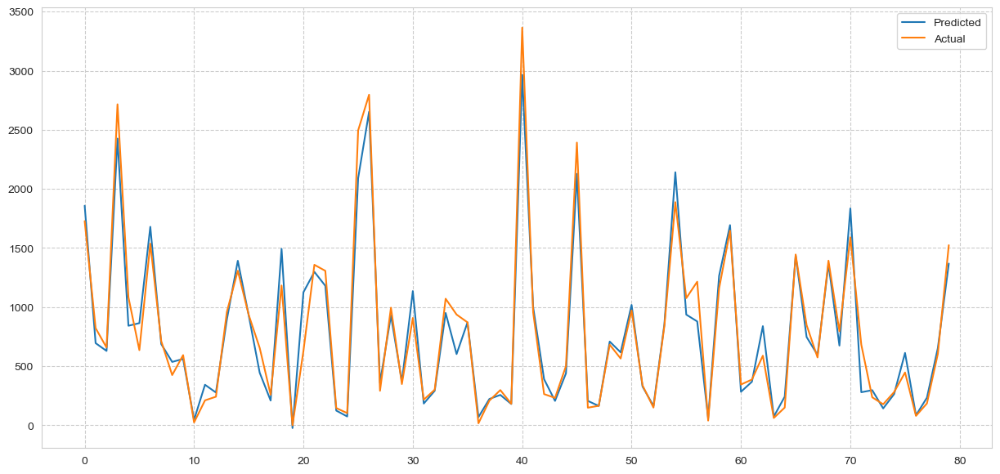

In [182]:
# Fitting and finding matrices 
score_metrix(stacking,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model explainability with Lime

In [184]:
# Calling lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(stacking,6,2)

Intercept 126.55726892809042
Prediction_local [902.77564671]
Right: 686.7723056419813


#<b> Creating Data Frame of all Evaluation Matrix with respect of models

In [186]:
#creating dictionary to store all the metrices 
all_matrices={'Mean_Absolute_error':mean_absolut_error_ht,'Mean_square_error':mean_sq_error_ht,'Root_Mean_square_error':root_mean_sq_error_ht,'Training_score':training_score_ht,'R2':r2_list_ht,'Adjusted_R2':adj_r2_list_ht}

{'Mean_Absolute_error': [195.73171385512205,
  195.7966482795977,
  195.75297894427493,
  107.75353499812215,
  4.014942517235466,
  198.8936073059361,
  166.03865672239615,
  115.92047945205479,
  130.3279481984994,
  115.7850016214804,
  96.51063386820744],
 'Mean_square_error': [82087.34965453463,
  82170.42846443261,
  82106.72088225963,
  32332.42001651601,
  27.903727900559225,
  111087.59771689498,
  64379.71996668419,
  38047.14434470319,
  41081.82722845239,
  33954.124022745156,
  27044.55538279751],
 'Root_Mean_square_error': [286.5088997824232,
  286.6538478102686,
  286.54270341828567,
  179.81217983361418,
  5.282397930917286,
  333.2980613758427,
  253.73159039954837,
  195.0567721067464,
  202.68652453592566,
  184.2664484455734,
  164.45228907740236],
 'Training_score': [0.8090578689067067,
  0.8090555455823615,
  0.8090572517937475,
  0.9430400564761591,
  0.8073309971677832,
  0.7904384279112786,
  0.8936370403170197,
  0.958918207919126,
  0.9265976606668778,
  0.94

In [188]:
#list of all model name 
model_name=['Linear','Lasso','Ridge','Polynomial','Stochastic Gradient Descent','Decision_Tree','Random_Forest','Bagging','Gradient_Boosting','Extreme Gradient Boosting','Stacking Regressor']

In [189]:
#converting dictionary to dataframe for simple visualization 
matrices_df=pd.DataFrame.from_dict(all_matrices,orient='index',columns=model_name)


In [190]:
# view our matrices_df
matrices_df

,Linear,Lasso,Ridge,Polynomial,Stochastic Gradient Descent,Decision_Tree,Random_Forest,Bagging,Gradient_Boosting,Extreme Gradient Boosting,Stacking Regressor
Mean_Absolute_error,195.731714,195.796648,195.752979,107.753535,4.014943,198.893607,166.038657,115.920479,130.327948,115.785002,96.510634
Mean_square_error,82087.349655,82170.428464,82106.720882,32332.420017,27.903728,111087.597717,64379.719967,38047.144345,41081.827228,33954.124023,27044.555383
Root_Mean_square_error,286.508900,286.653848,286.542703,179.812180,5.282398,333.298061,253.731590,195.056772,202.686525,184.266448,164.452289
Training_score,0.809058,0.809056,0.809057,0.943040,0.807331,0.790438,0.893637,0.958918,0.926598,0.947142,0.968293
R2,0.799396,0.799193,0.799349,0.920986,0.815629,0.728526,0.842670,0.907021,0.899605,0.917023,0.933909
Adjusted_R2,0.794899,0.794691,0.794850,0.820580,0.811496,0.725135,0.840705,0.905860,0.898351,0.915987,0.933083


In [191]:
# transpose our matrices_df for better view
matrices_df=matrices_df.transpose().reset_index().rename(columns={'index':'Models'})
matrices_df

,Models,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Linear,195.731714,82087.349655,286.508900,0.809058,0.799396,0.794899
1,Lasso,195.796648,82170.428464,286.653848,0.809056,0.799193,0.794691
2,Ridge,195.752979,82106.720882,286.542703,0.809057,0.799349,0.794850
3,Polynomial,107.753535,32332.420017,179.812180,0.943040,0.920986,0.820580
4,Stochastic Gradient Descent,4.014943,27.903728,5.282398,0.807331,0.815629,0.811496
5,Decision_Tree,198.893607,111087.597717,333.298061,0.790438,0.728526,0.725135
6,Random_Forest,166.038657,64379.719967,253.731590,0.893637,0.842670,0.840705
7,Bagging,115.920479,38047.144345,195.056772,0.958918,0.907021,0.905860
8,Gradient_Boosting,130.327948,41081.827228,202.686525,0.926598,0.899605,0.898351
9,Extreme Gradient Boosting,115.785002,33954.124023,184.266448,0.947142,0.917023,0.915987


#<b>Final Matrices Data Frame

In [193]:
# Sort matrices_df in Descending order to view which model have the best score
matrices_df=matrices_df.sort_values("Adjusted_R2",ascending=False).reset_index(drop=True)
matrices_df

,Models,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Stacking Regressor,96.510634,27044.555383,164.452289,0.968293,0.933909,0.933083
1,Extreme Gradient Boosting,115.785002,33954.124023,184.266448,0.947142,0.917023,0.915987
2,Bagging,115.920479,38047.144345,195.056772,0.958918,0.907021,0.905860
3,Gradient_Boosting,130.327948,41081.827228,202.686525,0.926598,0.899605,0.898351
4,Random_Forest,166.038657,64379.719967,253.731590,0.893637,0.842670,0.840705
5,Polynomial,107.753535,32332.420017,179.812180,0.943040,0.920986,0.820580
6,Stochastic Gradient Descent,4.014943,27.903728,5.282398,0.807331,0.815629,0.811496
7,Linear,195.731714,82087.349655,286.508900,0.809058,0.799396,0.794899
8,Ridge,195.752979,82106.720882,286.542703,0.809057,0.799349,0.794850
9,Lasso,195.796648,82170.428464,286.653848,0.809056,0.799193,0.794691


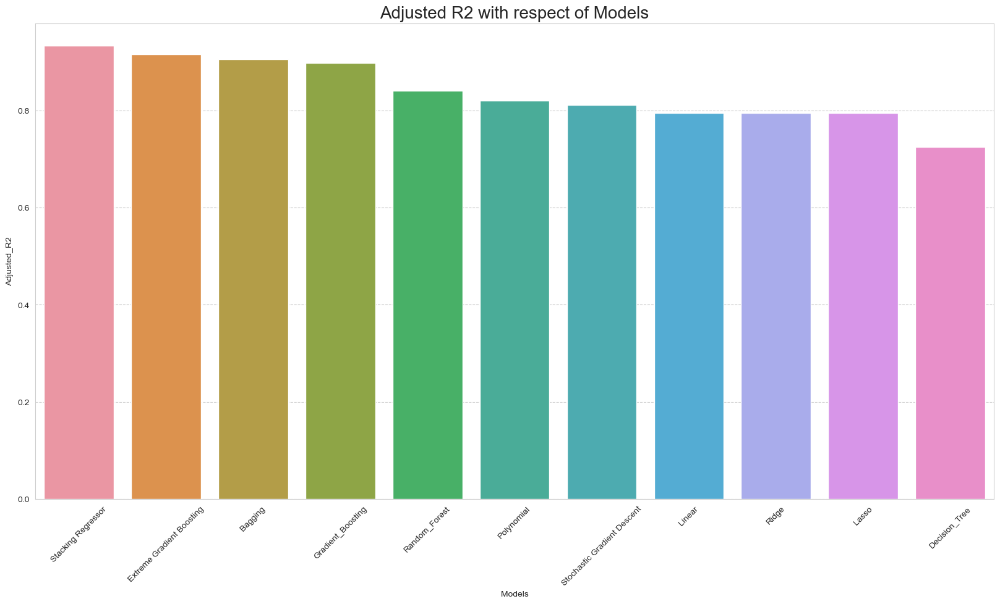

In [195]:
#Visulaizing the Adjusted R2 for all models
plt.figure(figsize=(20,10))
sns.barplot(x = matrices_df['Models'], y = matrices_df['Adjusted_R2'])
plt.title("Adjusted R2 with respect of Models",fontsize=20)
plt.xticks(rotation= 45)
plt.show()

#<b>Conclusion:

We obsereved that bike rental count is high during week days then weekend days.

The rental bike counts is at its peek at 8 AM in the morning and 6pm in the evening,
We can see an increasing trend from 5am to 8 am, the graph touches the peak at 8am and then there is dip in the graph.
Later we can see a gradual increase in the demand until 6pm, the demand is highest at 6 pm, and reduces there after until midnight,

We observed that people prefer to rent bikes at moderate to high tempreture, and even when it is little windy,

it is observed that highest bike rental count is in Autumn and summer seasons and the lowest is in winter season.

We observed that the bike rentals is highest during the clear days and lowest on snowy and rainy days.

when we compare the RMSE and Adjusted R2 of all the models, Stacking Regressor gives the highest Score where Adjusted R2 score is  0.90 and Training score is 0.95 so this model is the best for predicting the bike rental count on daily basis.







In [199]:
df.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,month,year,week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,December,2017,Weekdays
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,December,2017,Weekdays
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,December,2017,Weekdays
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,December,2017,Weekdays
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,December,2017,Weekdays


#<b>creating pipeline for export model for use of deployment

In [202]:
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import make_pipeline,Pipeline 
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder

In [204]:
df.columns

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day', 'month', 'year', 'week'],
      dtype='object')

In [206]:
x= df.drop(columns=['Rented Bike Count'])
y = df['Rented Bike Count']

In [208]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=0)

In [210]:
transformer = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore',sparse=False),['Seasons','Holiday','Functioning Day', 'month', 'year', 'week']),
remainder='passthrough')

In [212]:
scaling = ColumnTransformer([
    ('scale',MinMaxScaler(),slice(0,33))
])

In [214]:
pipe = make_pipeline(transformer,scaling,Ranom_forest_Grid_search.best_estimator_)

In [216]:
pipe.fit(x_train,y_train)

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Seasons', 'Holiday',
                                                   'Functioning Day', 'month',
                                                   'year', 'week'])])),
                ('columntransformer-2',
                 ColumnTransformer(transformers=[('scale', MinMaxScaler(),
                                                  slice(0, 33, None))])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=20, max_features='sqrt',
                                       min_samples_leaf=4, min_samples_split=25,
                                       n_estimators=150))])

In [217]:
# export 
import pickle
pickle.dump(pipe,open('bike.pkl','wb'))